In [ ]:
# import sys

# import numpy as np
# import matplotlib.pyplot as plt
# import pickle
# sys.path.append('../../map/')
# from map import *

# plotting the correct trajectory and map for a couple of instances of testing data

import sys
import pickle
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
sys.path.insert(0, "/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Prediction/MTR")
sys.path.append('../../map/')
from mtr.datasets.waymo.waymo_dataset import *
sys.path.append('../../map/')
from map import *

In [ ]:
with open('/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Prediction/MTR/output/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Prediction/MTR/tools/cfgs/challenge/mtr-testing-finetuning-V2XPNP/default/eval/epoch_30/default/result.pkl', 'rb') as file:
        test_results = pickle.load(file)

In [21]:
# test_results is a list object
# dict_keys(['scenario_id', 'pred_trajs', 'pred_scores', 'object_id', 'object_type', 'gt_trajs', 'track_index_to_predict'])
# 441 - number of scenarios considered
# (6, 80, 2)
# there are 7 keys for the dictionary
# there are 6 multimodal paths
# there are 2 (x,y) coordinates at each timestep
# there are 2 agents being predicted per scene
output_test_results = "/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Visualization/cpx_mtr_viz/test_results.txt"
with open(output_test_results, "w") as f:
    print(test_results[0][0], file=f)
    print(test_results[0][0].keys(), file=f)
    print(len(test_results), file=f)
    print(test_results[0][0]['pred_trajs'].shape, file=f)  # (6 modes, 80 timesteps, 2 coordinates)

In [22]:
print(f"Number of agents for the first scene: {len(test_results[0])}")
print(f"Number of dictionary keys: {len(test_results[0][0])}")
print(f"Shape of predicted trajs: {str(test_results[0][0]['pred_trajs'].shape)}")

Number of agents for the first scene: 2
Number of dictionary keys: 7
Shape of predicted trajs: (6, 80, 2)


In [23]:
# Check if the first agent and second agent in the batch are from the same scene
is_same_scene = test_results[0][0]['scenario_id'] == test_results[0][1]['scenario_id']
print(f"Are the first two agents from the same scene? {is_same_scene}")

Are the first two agents from the same scene? True


In [24]:
# basic plotting, only plot the traj
def plot_traj(sample_id, traj_id, data, mode):

    pred_traj = data[sample_id][traj_id]['pred_trajs']
    gt_traj = data[sample_id][traj_id]['gt_trajs']
    for i in range(mode):

        pred_traj_i = pred_traj[i]
        x_coords = pred_traj_i[:, 0]
        y_coords = pred_traj_i[:, 1]
        # print(x_coords.shape)
        x_coords = np.insert(x_coords, 0, gt_traj[10, 0])
        y_coords = np.insert(y_coords, 0, gt_traj[10, 1])
        

        plt.plot(x_coords, y_coords, marker='o', linestyle='-', color='red', markersize=1)

    plt.plot(gt_traj[:, 0], gt_traj[:, 1], marker='o', linestyle='-', color='blue', markersize=1)
    plt.plot(gt_traj[:11, 0], gt_traj[:11, 1], marker='o', linestyle='-', color='green', markersize=1)

    plt.plot(gt_traj[10][0], gt_traj[10][1], marker='*', color='yellow', markersize=5)

    plt.show()

In [25]:
# plot traj with map
def plot_traj_withmap(sample_id, traj_id, data, vector_map, mode):
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 25)

    legend_added = {}

    for feature in vector_map.map_features:
        if isinstance(feature, Lane):
            if feature.type == LaneType.Sidewalk:
                label = "Sidewalk" if "Sidewalk" not in legend_added else ""
                ax.plot([point.x for point in feature.polyline], [point.y for point in feature.polyline], 'k--',
                        linewidth=2, label=label)
                legend_added["Sidewalk"] = True
            elif feature.type == LaneType.Shoulder:
                #ax.plot([point.x for point in feature.polyline], [point.y for point in feature.polyline], 'k--', 
                #       linewidth=2, label=f"shoulder-{feature.road_id}-{feature.lane_id}")
                continue
            else:
                label = "Lane" if "Lane" not in legend_added else ""
                ax.plot([point.x for point in feature.polyline], [point.y for point in feature.polyline], 'k',
                        label=label)
                legend_added["Lane"] = True
        elif isinstance(feature, Crosswalk):
            label = "Crosswalk" if "Crosswalk" not in legend_added else ""
            polygon = feature.polygon
            ax.plot([point.x for point in polygon], [point.y for point in polygon], 'k', linewidth=2,
                    label=label)
            legend_added["Crosswalk"] = True
        elif isinstance(feature, RoadLine):
            label = "Road Line" if "Road Line" not in legend_added else ""
            ax.plot([point.x for point in feature.polyline], [point.y for point in feature.polyline], label=label)
            legend_added["Road Line"] = True
        elif isinstance(feature, WalkButton):
            label = "Walk Button" if "Walk Button" not in legend_added else ""
            ax.plot(feature.position.x, feature.position.y, "o", label=label)
            legend_added["Walk Button"] = True




    pred_traj = data[sample_id][traj_id]['pred_trajs']
    gt_traj = data[sample_id][traj_id]['gt_trajs']

    for i in range(mode):
        pred_traj_i = pred_traj[i]
        x_coords = pred_traj_i[:, 0]
        y_coords = pred_traj_i[:, 1]

        x_coords = np.insert(x_coords, 0, gt_traj[10, 0])
        y_coords = np.insert(y_coords, 0, gt_traj[10, 1])

        ax.plot(x_coords, y_coords, marker='o', linestyle='-', color='red', markersize=1)


    ax.plot(gt_traj[:, 0], gt_traj[:, 1], marker='o', linestyle='-', color='blue', markersize=1)
    ax.plot(gt_traj[:11, 0], gt_traj[:11, 1], marker='o', linestyle='-', color='green', markersize=1)

    ax.plot(gt_traj[10][0], gt_traj[10][1], marker='*', color='yellow', markersize=5)

    ax.legend()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.tight_layout()
    plt.show()

In [26]:
# plot with traj,map and heading (after optimization)
def plot_traj_withmap_withheading(sample_id, traj_id, data, vector_map, mode):
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 25)

    legend_added = {}

    for feature in vector_map.map_features:
        if isinstance(feature, Lane):
            if feature.type == LaneType.Sidewalk:
                label = "Sidewalk" if "Sidewalk" not in legend_added else ""
                ax.plot([point.x for point in feature.polyline], [point.y for point in feature.polyline], 'k--',
                        linewidth=2, label=label)
                legend_added["Sidewalk"] = True
            elif feature.type == LaneType.Shoulder:
                #ax.plot([point.x for point in feature.polyline], [point.y for point in feature.polyline], 'k--', 
                #       linewidth=2, label=f"shoulder-{feature.road_id}-{feature.lane_id}")
                continue
            else:
                label = "Lane" if "Lane" not in legend_added else ""
                ax.plot([point.x for point in feature.polyline], [point.y for point in feature.polyline], 'k',
                        label=label)
                legend_added["Lane"] = True
        elif isinstance(feature, Crosswalk):
            label = "Crosswalk" if "Crosswalk" not in legend_added else ""
            polygon = feature.polygon
            ax.plot([point.x for point in polygon], [point.y for point in polygon], 'k', linewidth=2,
                    label=label)
            legend_added["Crosswalk"] = True
        elif isinstance(feature, RoadLine):
            label = "Road Line" if "Road Line" not in legend_added else ""
            ax.plot([point.x for point in feature.polyline], [point.y for point in feature.polyline], label=label)
            legend_added["Road Line"] = True
        elif isinstance(feature, WalkButton):
            label = "Walk Button" if "Walk Button" not in legend_added else ""
            ax.plot(feature.position.x, feature.position.y, "o", label=label)
            legend_added["Walk Button"] = True


    pred_traj = data[sample_id][traj_id]['pred_trajs']
    gt_traj = data[sample_id][traj_id]['gt_trajs']
    pred_scores = data[sample_id][traj_id]['pred_scores']
    top3_indices = np.argsort(pred_scores)[-mode:][::-1]
    top3_scores = pred_scores[top3_indices]
    top3_pred_trajs = pred_traj[top3_indices]
    normalized_top3_scores = top3_scores / np.sum(top3_scores)

    for i in range(mode):
        pred_traj_i = top3_pred_trajs[i]
        x_coords = pred_traj_i[:, 0]
        y_coords = pred_traj_i[:, 1]

        x_coords = np.insert(x_coords, 0, gt_traj[10, 0])
        y_coords = np.insert(y_coords, 0, gt_traj[10, 1])
        
        ax.plot(x_coords, y_coords, marker='o', linestyle='-', color='Red', markersize=0.5, alpha = 0.5)
        ax.annotate(f'{normalized_top3_scores[i]:.4f}', 
                xy=(x_coords[-1], y_coords[-1]),  # Position at the end of the trajectory
                textcoords="offset points", 
                xytext=(5,5), 
                ha='center', 
                color='Blue')
        # ax.plot(x_coords, y_coords, marker='o', linestyle='-', color='red', markersize=1)


    # for i in range(mode):
    #     pred_traj_i = pred_traj[i]
    #     x_coords = pred_traj_i[:, 0]
    #     y_coords = pred_traj_i[:, 1]

    #     x_coords = np.insert(x_coords, 0, gt_traj[10, 0])
    #     y_coords = np.insert(y_coords, 0, gt_traj[10, 1])
        
    #     # print(i, top3_indices)
    #     ax.plot(x_coords, y_coords, marker='o', linestyle='-', color='red', markersize=1)

    ax.plot(gt_traj[:, 0], gt_traj[:, 1], marker='o', linestyle='-', color='blue', markersize=0.5, alpha = 0.5) # gt trajectory is plotted in blue
    ax.plot(gt_traj[:11, 0], gt_traj[:11, 1], marker='o', linestyle='-', color='green', markersize=0.5, alpha = 0.5) # history is plotted in green

    ax.plot(gt_traj[10][0], gt_traj[10][1], marker='*', color='yellow', markersize=5)
    ax.quiver(gt_traj[10][0], gt_traj[10][1], np.cos(gt_traj[10][6]),np.sin(gt_traj[10][6]), color='orange',scale = 0.1,angles='xy',scale_units='xy',width=0.006, alpha = 0.3) # plotting the heading of gt trajectory at the 10th timestep


    ax.legend()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.tight_layout()
    plt.show()

In [27]:
def plot_traj_withmap_withheading_specific(sample_id, data, vector_map, mode):
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    import numpy as np
    
    # We need these classes to identify map features
    # Assuming these are available in your scope, otherwise you might need to import them
    # from your_project.map_utils import Lane, LaneType, Crosswalk, RoadLine

    # --- 0. Pre-Calculation of Scene Statistics (WITH MASKING) ---
    scene_agents = data[sample_id]
    scenario_id = scene_agents[0].get('scenario_id', 'Unknown')
    
    total_min_ade = 0
    total_min_fde = 0
    valid_agents_count = 0

    # Calculate errors for the whole scene before plotting
    for agent in scene_agents:
        gt_traj = agent['gt_trajs']
        gt_future = gt_traj[10:, :2]  # Future positions
        
        # --- FIX 1: CREATE MASK ---
        # Identify valid frames (not 0,0 padding)
        # We assume if x and y are both 0.0, it is invalid padding
        mask = (gt_future[:, 0] != 0) | (gt_future[:, 1] != 0)
        
        # If the agent has no valid future data, skip it
        if np.sum(mask) == 0:
            continue

        pred_trajs = agent['pred_trajs']
        pred_scores = agent['pred_scores']
        
        # Get top modes
        top_indices = np.argsort(pred_scores)[-mode:][::-1]
        top_preds = pred_trajs[top_indices]

        agent_ades = []
        agent_fdes = []
        
        for k in range(mode):
            pred_future = top_preds[k][:, :2]
            
            # --- FIX 2: APPLY MASK TO METRICS ---
            min_len = min(len(gt_future), len(pred_future))
            
            # Only use the mask for the frames that exist in both GT and Pred
            valid_mask = mask[:min_len]
            
            if np.sum(valid_mask) > 0:
                diff = gt_future[:min_len] - pred_future[:min_len]
                l2_dist = np.linalg.norm(diff, axis=1)
                
                # Filter metrics using the mask
                valid_l2 = l2_dist[valid_mask]
                
                agent_ades.append(np.mean(valid_l2))
                agent_fdes.append(valid_l2[-1])
            else:
                # If no valid overlap, assign high error to ignore this mode later if needed
                agent_ades.append(9999.0)
                agent_fdes.append(9999.0)
        
        # Select best mode
        if agent_ades:
            best_ade = min(agent_ades)
            if best_ade < 9999.0:
                total_min_ade += best_ade
                total_min_fde += min(agent_fdes)
                valid_agents_count += 1

    avg_ade = total_min_ade / valid_agents_count if valid_agents_count > 0 else 0
    avg_fde = total_min_fde / valid_agents_count if valid_agents_count > 0 else 0

    print(f"--- Scene Stats (ID: {sample_id}) ---")
    print(f"Valid Agents: {valid_agents_count}")
    print(f"Scene minADE: {avg_ade:.4f}")
    print(f"Scene minFDE: {avg_fde:.4f}")

    # --- 1. Setup Plot ---
    fig, ax = plt.subplots()
    fig.set_size_inches(20, 25)
    legend_added = {}

    # --- 2. RESTORED: Plot Map Features ---
    # This section was missing in the previous snippet
    for feature in vector_map.map_features:
        if isinstance(feature, Lane):
            if feature.type == LaneType.Sidewalk:
                label = "Sidewalk" if "Sidewalk" not in legend_added else ""
                ax.plot([p.x for p in feature.polyline], [p.y for p in feature.polyline], 
                        'k--', linewidth=1, alpha=0.5, label=label)
                legend_added["Sidewalk"] = True
            elif feature.type == LaneType.Shoulder:
                continue
            else:
                label = "Lane" if "Lane" not in legend_added else ""
                ax.plot([p.x for p in feature.polyline], [p.y for p in feature.polyline], 
                        'k', linewidth=1, alpha=0.3, label=label)
                legend_added["Lane"] = True
        elif isinstance(feature, Crosswalk):
            label = "Crosswalk" if "Crosswalk" not in legend_added else ""
            polygon = feature.polygon
            ax.plot([p.x for p in polygon], [p.y for p in polygon], 
                    'k', linewidth=1, alpha=0.5, label=label)
            legend_added["Crosswalk"] = True
        elif isinstance(feature, RoadLine):
            ax.plot([p.x for p in feature.polyline], [p.y for p in feature.polyline], 'k', alpha=0.5)

    # --- 3. Iterate Agents ---
    min_agent_x, max_agent_x = float('inf'), float('-inf')
    min_agent_y, max_agent_y = float('inf'), float('-inf')

    for traj_id in range(len(scene_agents)):
        agent_data = scene_agents[traj_id]
        object_type = agent_data['object_type']
        
        pred_traj = agent_data['pred_trajs']
        gt_traj = agent_data['gt_trajs']
        pred_scores = agent_data['pred_scores']
        
        top3_indices = np.argsort(pred_scores)[-mode:][::-1]
        top3_pred_trajs = pred_traj[top3_indices]
        top3_scores = pred_scores[top3_indices]

        curr_x = gt_traj[10][0]
        curr_y = gt_traj[10][1]
        heading = gt_traj[10][6] 

        # --- Colors ---
        if object_type == "TYPE_VEHICLE":
            agent_color, history_color = 'cyan', 'dodgerblue'
            label_name = "Vehicle"
            width, height = 4.5, 2.0
            shape_patch = patches.Rectangle((curr_x - width/2, curr_y - height/2), 
                                            width, height, angle=np.degrees(heading),
                                            rotation_point='center', edgecolor='black',
                                            facecolor=agent_color, alpha=0.9, zorder=5)
        elif object_type == "TYPE_PEDESTRIAN":
            agent_color, history_color = 'orange', 'tomato'
            label_name = "Pedestrian"
            shape_patch = patches.Circle((curr_x, curr_y), radius=0.6, 
                                         edgecolor='black', facecolor=agent_color, alpha=0.9, zorder=5)
        elif object_type == "TYPE_CYCLIST":
            agent_color, history_color = 'lime', 'darkgreen'
            label_name = "Cyclist"
            shape_patch = patches.RegularPolygon((curr_x, curr_y), numVertices=3, radius=1.2, 
                                                 orientation=heading, edgecolor='black',
                                                 facecolor=agent_color, alpha=0.9, zorder=5)
        else:
            agent_color, history_color = 'yellow', 'goldenrod'
            label_name = "Unknown"
            shape_patch = patches.Circle((curr_x, curr_y), radius=0.5, color=agent_color)

        # Legend Logic
        current_label = label_name if label_name not in legend_added else ""
        if current_label: 
            legend_added[label_name] = True
            ax.plot([], [], color=agent_color, marker='o', label=current_label, linestyle='None')

        ax.add_patch(shape_patch)

        # --- FIX 3: PLOT HISTORY (MASKED) ---
        hist_x = gt_traj[:11, 0]
        hist_y = gt_traj[:11, 1]
        # Ignore (0,0) points
        hist_mask = (hist_x != 0) | (hist_y != 0)
        ax.plot(hist_x[hist_mask], hist_y[hist_mask], 
                color=history_color, linewidth=1.5, linestyle='-', alpha=0.7, zorder=3)
        
        # --- FIX 4: PLOT GT FUTURE (MASKED) ---
        fut_x = gt_traj[10:, 0]
        fut_y = gt_traj[10:, 1]
        fut_mask = (fut_x != 0) | (fut_y != 0)
        ax.plot(fut_x[fut_mask], fut_y[fut_mask], 
                color=agent_color, linewidth=2, linestyle='-', alpha=0.8, zorder=4)

        # --- FIX 5: PLOT PREDICTIONS (MASKED) ---
        for i in range(mode):
            pred_traj_i = top3_pred_trajs[i]
            px = pred_traj_i[:, 0]
            py = pred_traj_i[:, 1]
            
            # Insert current pos
            px = np.insert(px, 0, curr_x)
            py = np.insert(py, 0, curr_y)

            # Masking prediction if it drops to exactly 0,0
            p_mask = (px != 0) | (py != 0)
            
            is_best = (i == 0)
            lw = 1.5 if is_best else 0.5
            
            ax.plot(px[p_mask], py[p_mask], color=agent_color, linestyle='--', linewidth=lw, alpha=0.6)

            if is_best:
                score_str = f"{top3_scores[i]:.2f}"
                offset_x, offset_y = 1.5, 1.5
                ax.text(curr_x + offset_x, curr_y + offset_y, score_str, 
                        color='black', fontsize=9, fontweight='bold',
                        bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', pad=0.2), zorder=7)

        # Update Bounds (only using valid data)
        # We check if curr_x is 0.0 (padding) before updating bounds to prevent zooming on 0,0
        if curr_x != 0 or curr_y != 0:
            min_agent_x = min(min_agent_x, curr_x)
            max_agent_x = max(max_agent_x, curr_x)
            min_agent_y = min(min_agent_y, curr_y)
            max_agent_y = max(max_agent_y, curr_y)

    # --- Formatting ---
    stats_text = (f"Scenario ID: {scenario_id}\n"
                  f"minADE: {avg_ade:.2f}m\n"
                  f"minFDE: {avg_fde:.2f}m")
    
    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black'))

    zoom_range = 40
    if min_agent_x != float('inf'):
        ax.set_xlim(min_agent_x - zoom_range, max_agent_x + zoom_range)
        ax.set_ylim(min_agent_y - zoom_range, max_agent_y + zoom_range)
    
    ax.set_aspect('equal')
    ax.legend(loc='upper right')
    plt.title(f"Trajectory Prediction Visualization - Sample {sample_id}")
    plt.tight_layout()
    plt.show()

In [28]:
def get_testing_set(cfg_file):
    # get dataloader
    import sys
    sys.path.insert(0, '../')
    mtr_root = "/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Prediction/MTR"
    if mtr_root not in sys.path:
        sys.path.insert(0, mtr_root)
    from mtr.datasets import build_dataloader
    from mtr.config import cfg, cfg_from_list, cfg_from_yaml_file, log_config_to_file
    from mtr.utils import common_utils
    import datetime
    from pathlib import Path
    
   
    cfg_from_yaml_file(cfg_file, cfg)
    log_file = "/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Visualization/cpx_mtr_viz/log_file.txt"
    logger = common_utils.create_logger(log_file, rank=cfg.LOCAL_RANK)
    test_set, test_loader, sampler = build_dataloader(dataset_cfg=cfg.DATA_CONFIG, dist=False, batch_size=80, training=False, logger=logger)
    # Access the dataset from the dataloader
    dataset_from_dataloader = test_loader.dataset
    # Now you can use dataset_from_dataloader as needed
    print(f"Dataset: {dataset_from_dataloader}")
    print(f"Number of samples in the dataset: {len(dataset_from_dataloader)}")
    return dataset_from_dataloader
    

In [29]:
def convert_lane_type(type_str):
        """Convert MTR lane type to your LaneType enum."""
        type_map = {
            'TYPE_FREEWAY': LaneType.Driving,
            'TYPE_SURFACE_STREET': LaneType.Driving,
            'TYPE_BIKE_LANE': LaneType.Sidewalk,
        }
        return type_map.get(type_str, LaneType.Unknown)

def create_map_object(map_infos):
        # Lane, Crosswalk, RoadLine, WalkButton -> Map
        # deal with lane
        polylines = torch.from_numpy(map_infos['all_polylines'].copy())
        map_features = []
        for lane in map_infos['lane']:
            # print("Processing Lane")
            # each lane is a dictionary
            start_polyline_index, end_polyline_index = lane['polyline_index']
            # polylines stores all_polylines
            geometry = polylines[start_polyline_index:end_polyline_index]
            # make sure that all_polylines consist of these 2D points
            polyline = [MapPoint(x=float(polyline[0]), y=float(polyline[1])) for polyline in geometry]
            road_id = lane['id']
            lane_id = lane['id']
            lane_type = convert_lane_type(lane['type'])
            # entry_lanes = [str(entry_lane) for entry_lane in lane['entry_lanes']]
            # exit_lanes = [str(exit_lane) for exit_lane in map_infos['exit_lanes']]
            # need to copy multiple left and right boundaries
            # left_boundary': [{'start_index': 0, 'end_index': 22, 'feature_id': 92, 'boundary_type': 0}]
            # 'right_boundary': [{'start_index': 0, 'end_index': 40, 'feature_id': 135, 'boundary_type': 'TYPE_UNKNOWN'}, {'start_index': 58, 'end_index': 72, 'feature_id': 135, 'boundary_type': 'TYPE_UNKNOWN'}]
            # skip boundary for now # TODO
            # left_boundary = map_infos['left_boundary']
            # left_start_index = left_boundary['start_index']
            # right_boundary = map_infos['right_boundary']
            lane_object = Lane(road_id=road_id, lane_id=lane_id, type=lane_type, polyline=polyline, entry_lanes=None, exit_lanes=None, boundary=None)
            map_features.append(lane_object)
            
        # deal with crosswalk
        # 'crosswalk': [{'id': 595, 'polyline_index': (26466, 26470)}, {'id': 596, 'polyline_index': (26470, 26474)}, {'id': 597, 'polyline_index': (26474, 26478)}
        for crosswalk in map_infos['crosswalk']:
            # print("Processing crosswalk")
            crosswalk_id = crosswalk['id']
            start_polyline_index, end_polyline_index = lane['polyline_index']
            # polylines stores all_polylines
            geometry = polylines[start_polyline_index:end_polyline_index]
            # make sure that all_polylines consist of these 2D points
            polyline = [MapPoint(x=float(polyline[0]), y=float(polyline[1])) for polyline in geometry]
            crosswalk_object = Crosswalk(polygon=polyline, id=crosswalk_id)
        
        # deal with roadline
        # 'road_line': [{'id': 1, 'type': 'TYPE_BROKEN_SINGLE_WHITE', 'polyline_index': (0, 141)}, {'id': 2, 'type': 'TYPE_BROKEN_SINGLE_WHITE', 'polyline_index': (141, 354)}
        for road_line in map_infos['road_line']:
            # print("Processing road line")
            roadline_id = road_line['id']
            roadline_type = convert_lane_type(road_line['type'])
            start_polyline_index, end_polyline_index = road_line['polyline_index']
            # polylines stores all_polylines
            geometry = polylines[start_polyline_index:end_polyline_index]
            # make sure that all_polylines consist of these 2D points
            polyline = [MapPoint(x=float(polyline[0]), y=float(polyline[1])) for polyline in geometry]
            roadline_object = RoadLine(id=roadline_id, type=roadline_type, polyline=polyline)
            map_features.append(roadline_object)
        # return a Map object with no dynamic states and only map_features defined
        final_map_data = Map(map_features = map_features, dynamic_states = None)
        return final_map_data

In [30]:
cfg_file_path = '/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Prediction/MTR/tools/cfgs/challenge/mtr-testing-CPX-Prediction.yaml'
testing_set = get_testing_set(cfg_file=cfg_file_path)
testing_set_output_path = "/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Visualization/cpx_mtr_viz/testing_set.txt"
with open(testing_set_output_path, "w") as f:
    print(testing_set, file=f)
    print(len(testing_set), file=f)
    

2025-12-24 17:43:16,903   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:16,903   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:16,903   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:16,903   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:17,519   INFO  Total scenes before filters: 882
2025-12-24 17:43:17,519   INFO  Total scenes before filters: 882
2025-12-24 17:43:17,519   INFO  Total scenes before filters: 882
2025-12-24 17:43:17,519   INFO  Total scenes before filters: 882
2025-12-24 17:43:17,529   INFO  Total scenes after filter_info_by_object_type: 882
2025-12-24 17:43:17,529   INFO  Total scenes after filter_info_by_object_type: 882
2025-12-24 17:43:17,529   INFO  Total scenes after filter_info_by_object_type: 882
2025-12

Dataset: <mtr.datasets.waymo.waymo_dataset.WaymoDataset object at 0x7f2828500280>
Number of samples in the dataset: 882


In [31]:
raw_map_data_path = "/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Visualization/cpx_mtr_viz/raw_map.txt"
with open (raw_map_data_path, "w") as f:
    cfg_file_path = '/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Prediction/MTR/tools/cfgs/challenge/mtr-testing-CPX-Prediction.yaml'
    testing_set = get_testing_set(cfg_file=cfg_file_path)
    raw_map_data = testing_set.get_map_data_by_id("b85e1bd6cc8e74c0")
    map_object = create_map_object(raw_map_data)
    print(raw_map_data, file=f)
    print("-----------------------")
    print(map_object, file=f)

2025-12-24 17:43:17,592   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:17,592   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:17,592   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:17,592   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:17,592   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:18,146   INFO  Total scenes before filters: 882
2025-12-24 17:43:18,146   INFO  Total scenes before filters: 882
2025-12-24 17:43:18,146   INFO  Total scenes before filters: 882
2025-12-24 17:43:18,146   INFO  Total scenes before filters: 882
2025-12-24 17:43:18,146   INFO  Total scenes before filters: 882
2025-12-24 17:43:18,158   INFO  Total scenes after filter_info_by_obje

Dataset: <mtr.datasets.waymo.waymo_dataset.WaymoDataset object at 0x7f2828500040>
Number of samples in the dataset: 882
-----------------------


In [32]:
# # need to create a dictionary of vector maps that correspond to the scenario id's
# # each vector map consists of the map.py objects
# cfg_file_path = '/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Prediction/MTR/tools/cfgs/challenge/mtr-testing-CPX-Prediction.yaml'
# testing_set = get_testing_set(cfg_file=cfg_file_path)
# vector_map_dict = {}
# for i in range(len(test_results)):
#     scenario_id = str(test_results[i][0]['scenario_id'])
#     raw_map_data = testing_set.get_map_data_by_id(scenario_id)
#     map_object = create_map_object(raw_map_data)
#     vector_map_dict[scenario_id] = map_object
    

In [33]:
# # plot VEHICLE traj output
# k = 0
# for i in range(len(test_results)):
#     for j in range(len(test_results[i])):
#         if test_results[i][j]['object_type'] == 'TYPE_VEHICLE':
#             scenario_id = str(test_results[i][j]['scenario_id'])
#             vector_map = vector_map_dict[scenario_id]
#             if vector_map is not None:
#                 plot_traj_withmap_withheading(i,j, test_results,vector_map,6)
#                 print('----------------------------------------------------')
#                 k += 1
#     if k >= 10:
#         break

2025-12-24 17:43:38,068   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:38,068   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:38,068   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:38,068   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:38,068   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:38,068   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:38,068   INFO  Start to load infos from /data/dataset/CP-X/data/waymo/processed_scenarios_val_infos.pkl
2025-12-24 17:43:38,793   INFO  Total scenes before filters: 882
2025-12-24 17:43:38,793   INFO  Total scenes before filters: 882
2025-12-24 17:43:38,793

Dataset: <mtr.datasets.waymo.waymo_dataset.WaymoDataset object at 0x7f2838ee1030>
Number of samples in the dataset: 882
--- Scene Stats (ID: 0) ---
Valid Agents: 2
Scene minADE: 5.0268
Scene minFDE: 11.7730


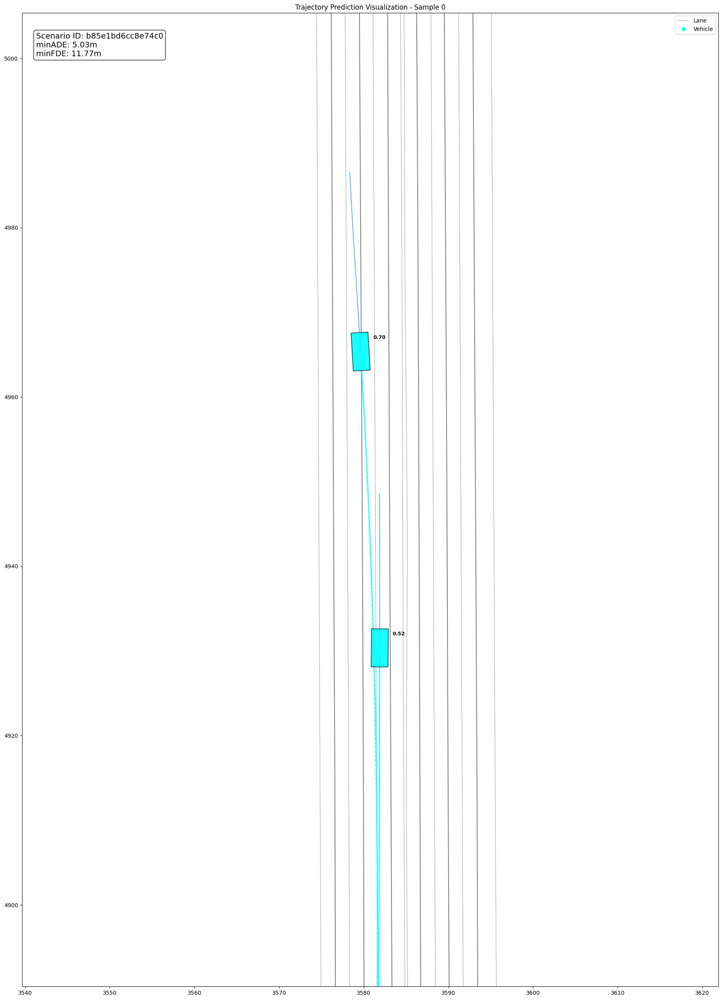

Scenario:0, Scenario ID:b85e1bd6cc8e74c0, Number of Agents:2
--- Scene Stats (ID: 1) ---
Valid Agents: 2
Scene minADE: 7.5484
Scene minFDE: 21.5770


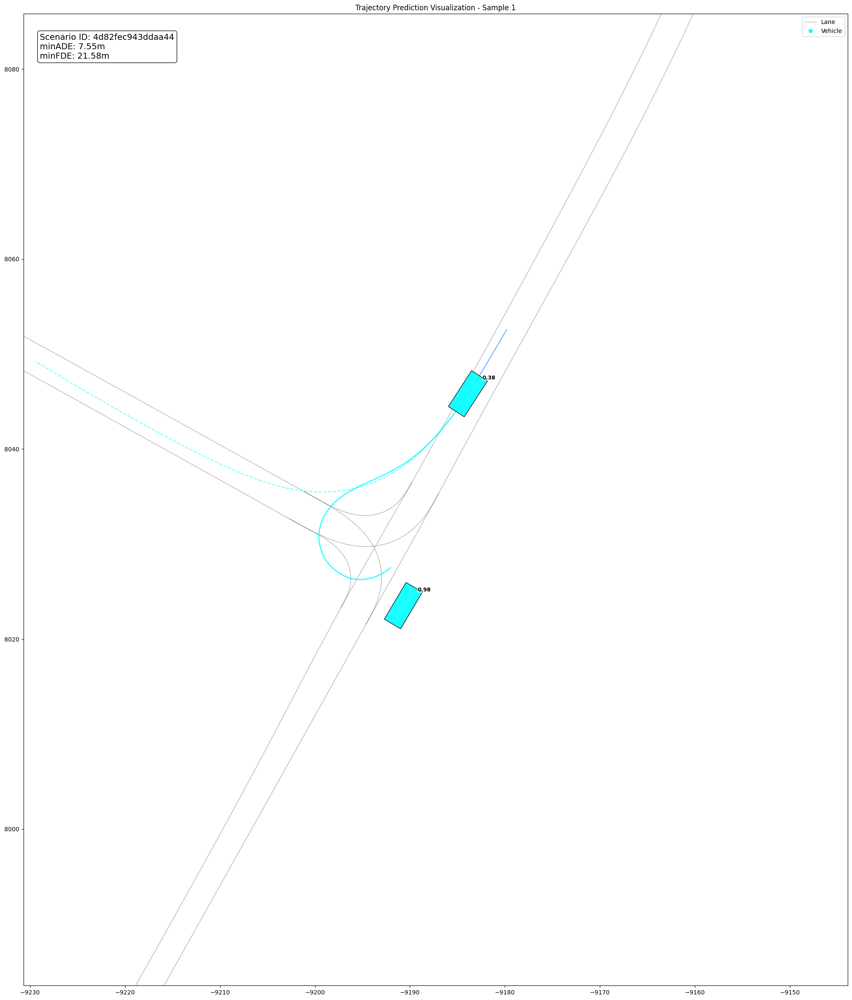

Scenario:1, Scenario ID:4d82fec943ddaa44, Number of Agents:2
--- Scene Stats (ID: 2) ---
Valid Agents: 4
Scene minADE: 6.8736
Scene minFDE: 20.3352


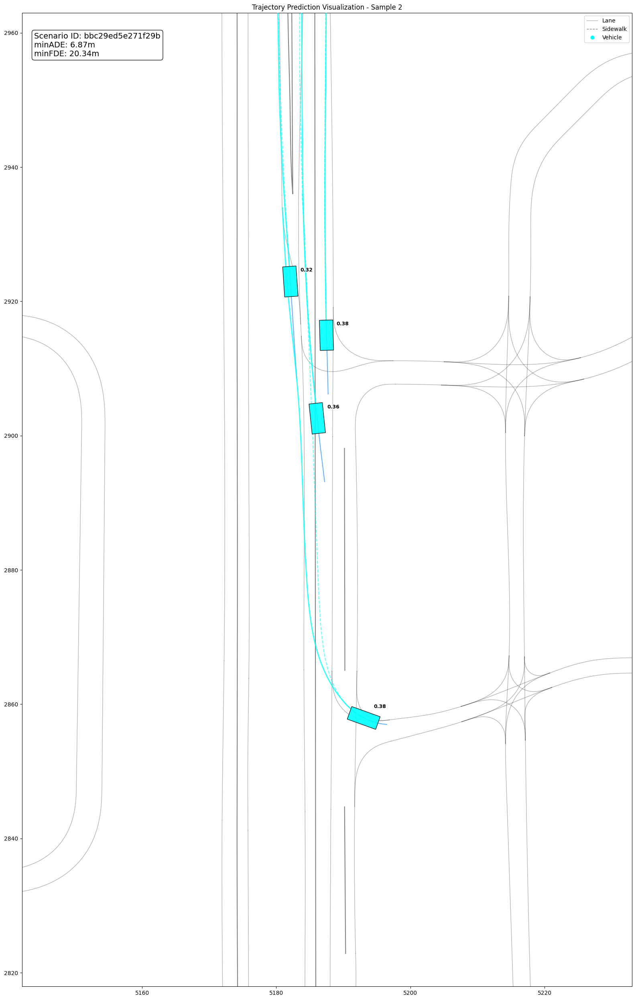

Scenario:2, Scenario ID:bbc29ed5e271f29b, Number of Agents:4
--- Scene Stats (ID: 3) ---
Valid Agents: 1
Scene minADE: 1.8645
Scene minFDE: 4.4357


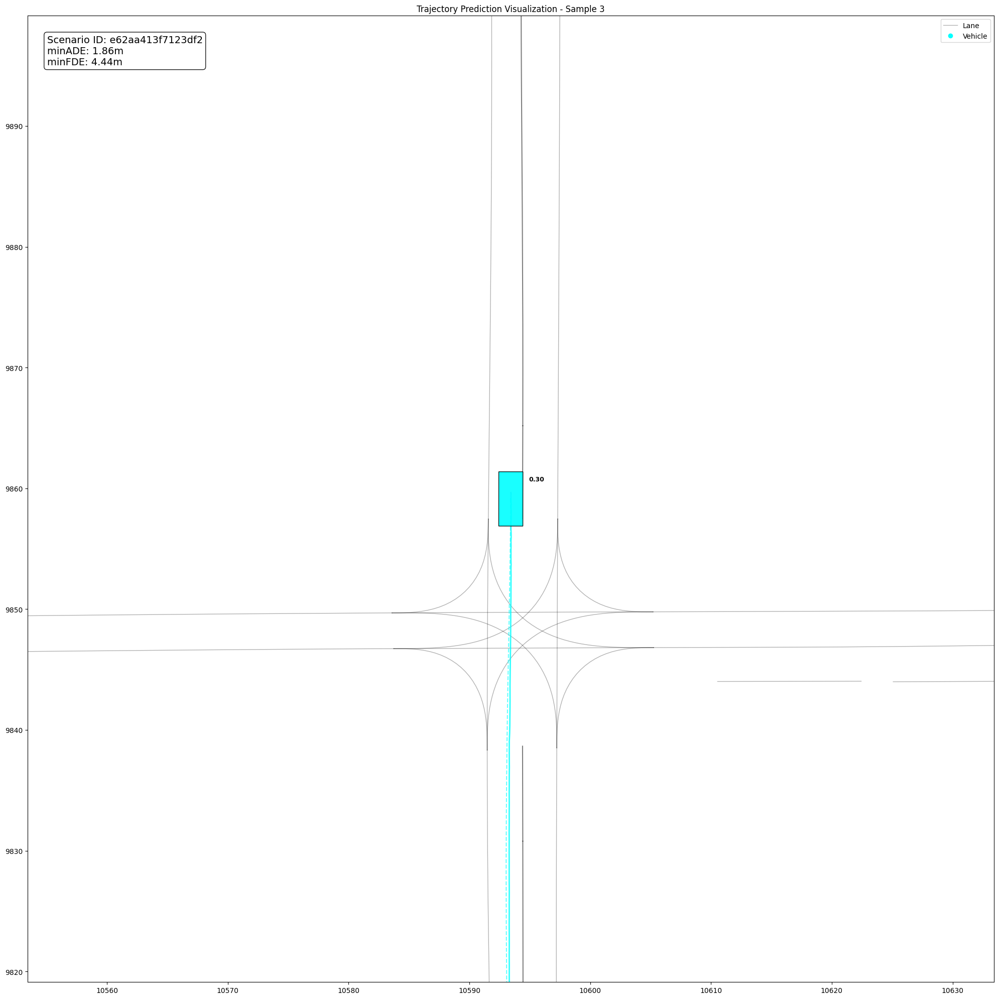

Scenario:3, Scenario ID:e62aa413f7123df2, Number of Agents:1
--- Scene Stats (ID: 4) ---
Valid Agents: 4
Scene minADE: 3.5201
Scene minFDE: 7.8005


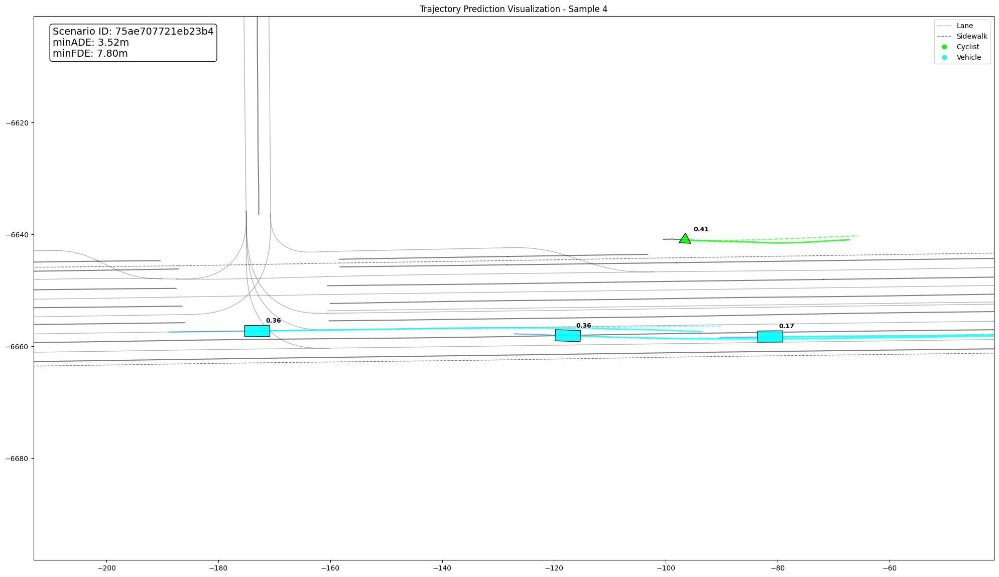

Scenario:4, Scenario ID:75ae707721eb23b4, Number of Agents:4
--- Scene Stats (ID: 5) ---
Valid Agents: 3
Scene minADE: 2.3990
Scene minFDE: 4.1111


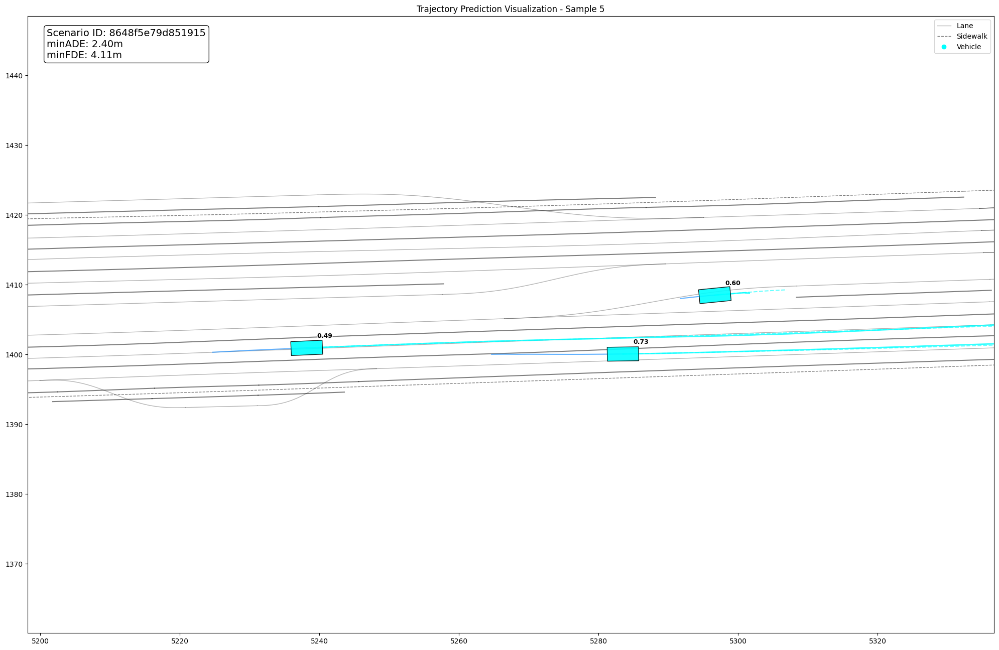

Scenario:5, Scenario ID:8648f5e79d851915, Number of Agents:3
--- Scene Stats (ID: 6) ---
Valid Agents: 2
Scene minADE: 2.3063
Scene minFDE: 2.7505


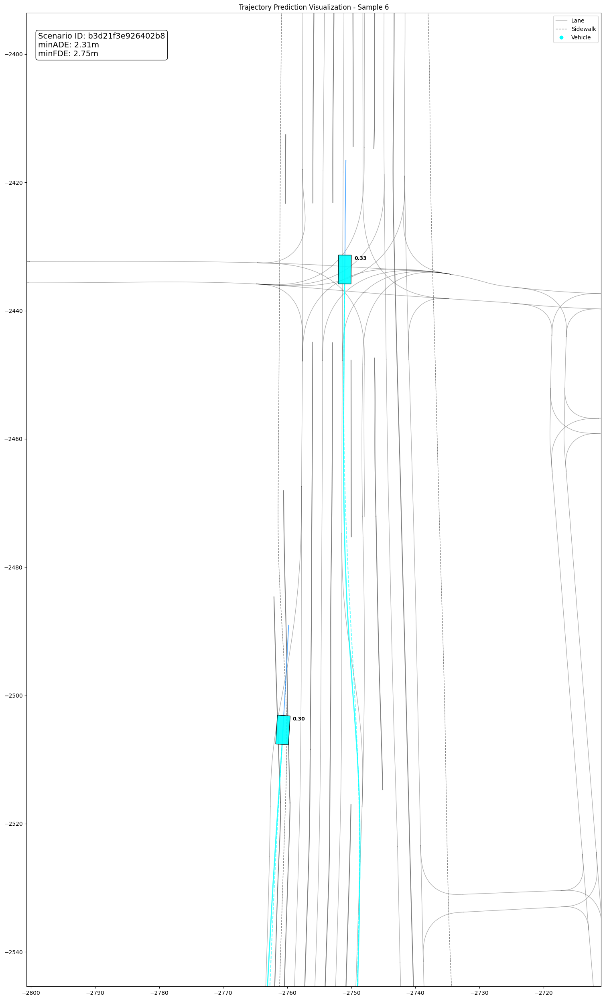

Scenario:6, Scenario ID:b3d21f3e926402b8, Number of Agents:2
--- Scene Stats (ID: 7) ---
Valid Agents: 1
Scene minADE: 6.4580
Scene minFDE: 16.2451


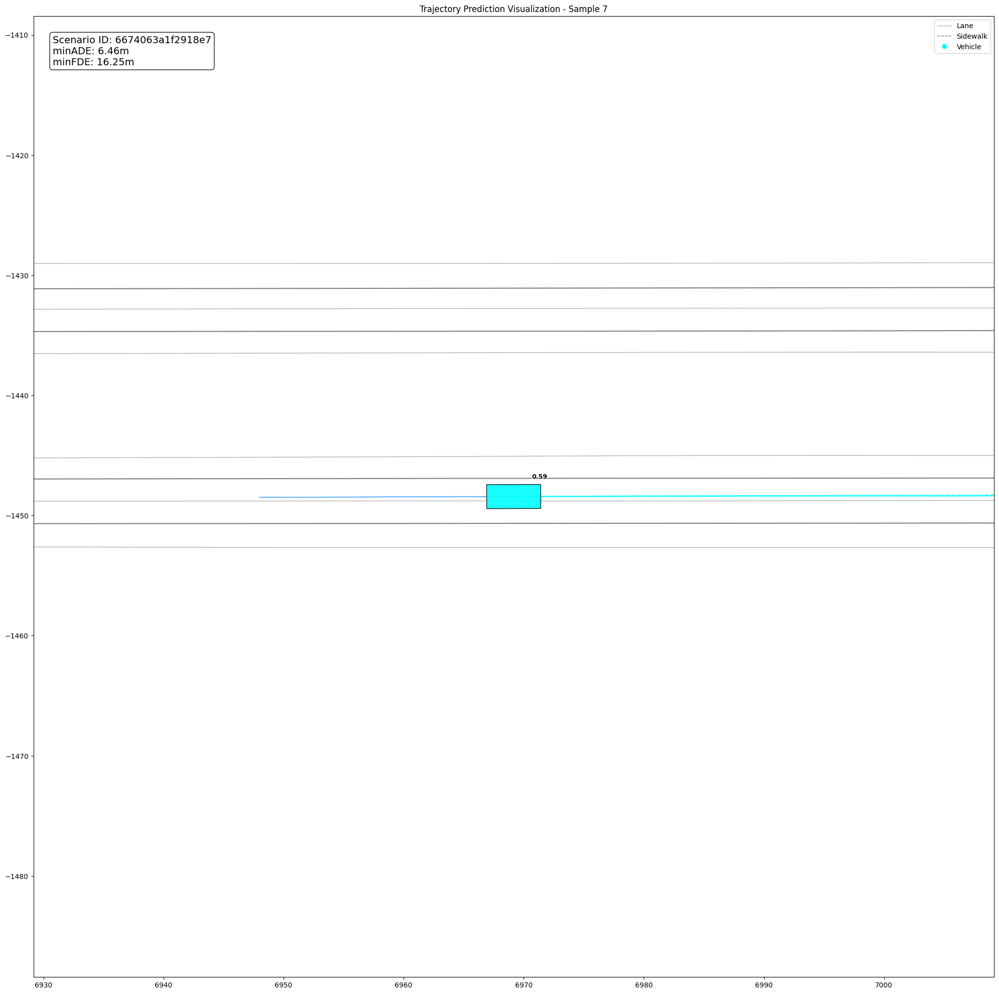

Scenario:7, Scenario ID:6674063a1f2918e7, Number of Agents:1
--- Scene Stats (ID: 8) ---
Valid Agents: 7
Scene minADE: 1.5467
Scene minFDE: 2.5743


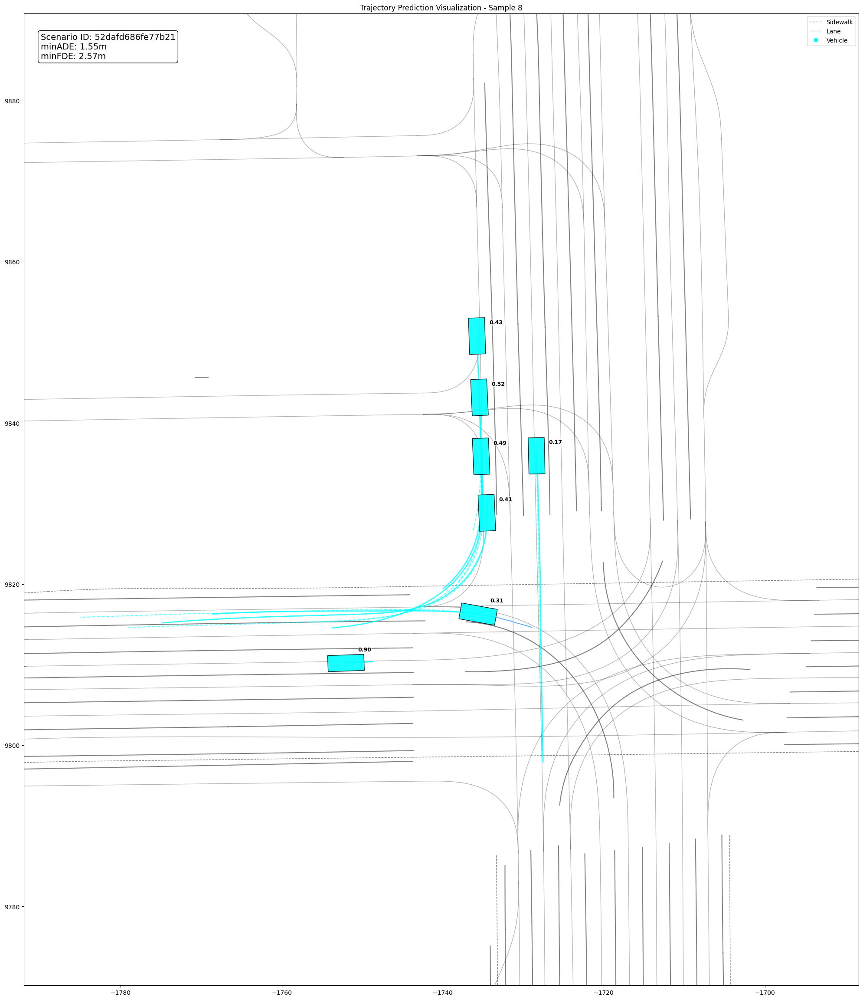

Scenario:8, Scenario ID:52dafd686fe77b21, Number of Agents:7
--- Scene Stats (ID: 9) ---
Valid Agents: 8
Scene minADE: 2.7265
Scene minFDE: 5.8263


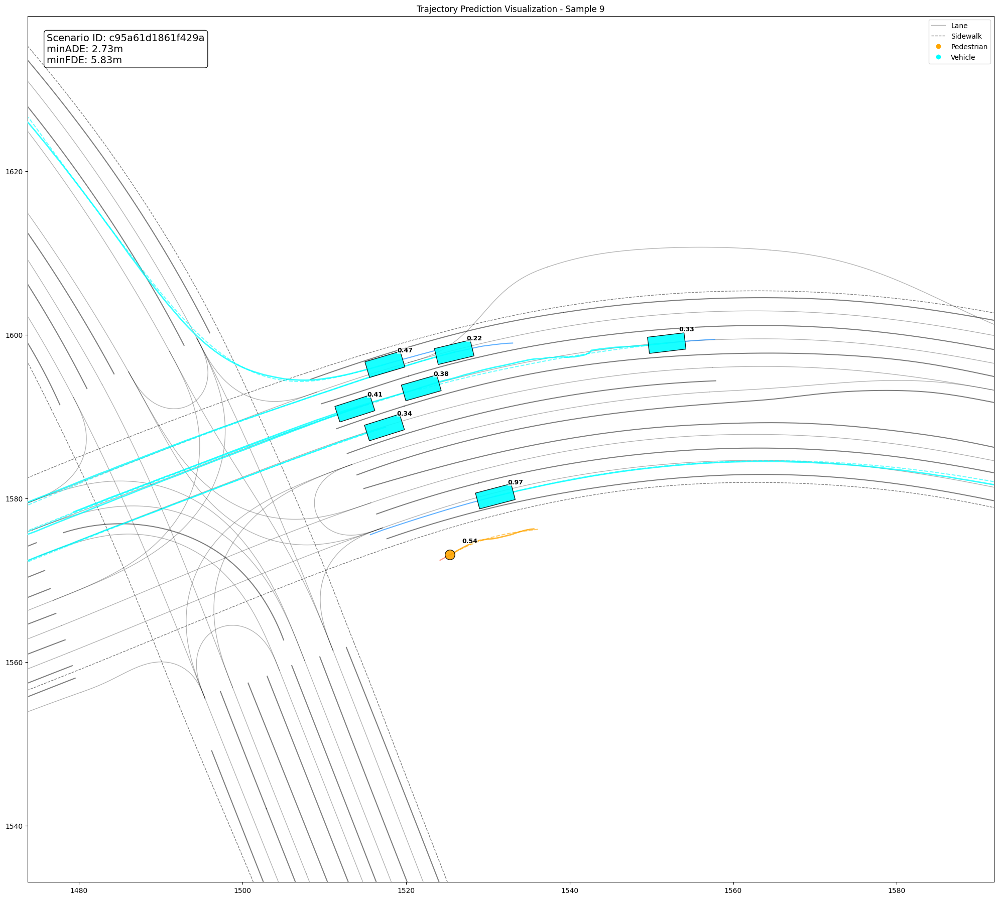

Scenario:9, Scenario ID:c95a61d1861f429a, Number of Agents:8
--- Scene Stats (ID: 10) ---
Valid Agents: 2
Scene minADE: 3.2247
Scene minFDE: 6.8704


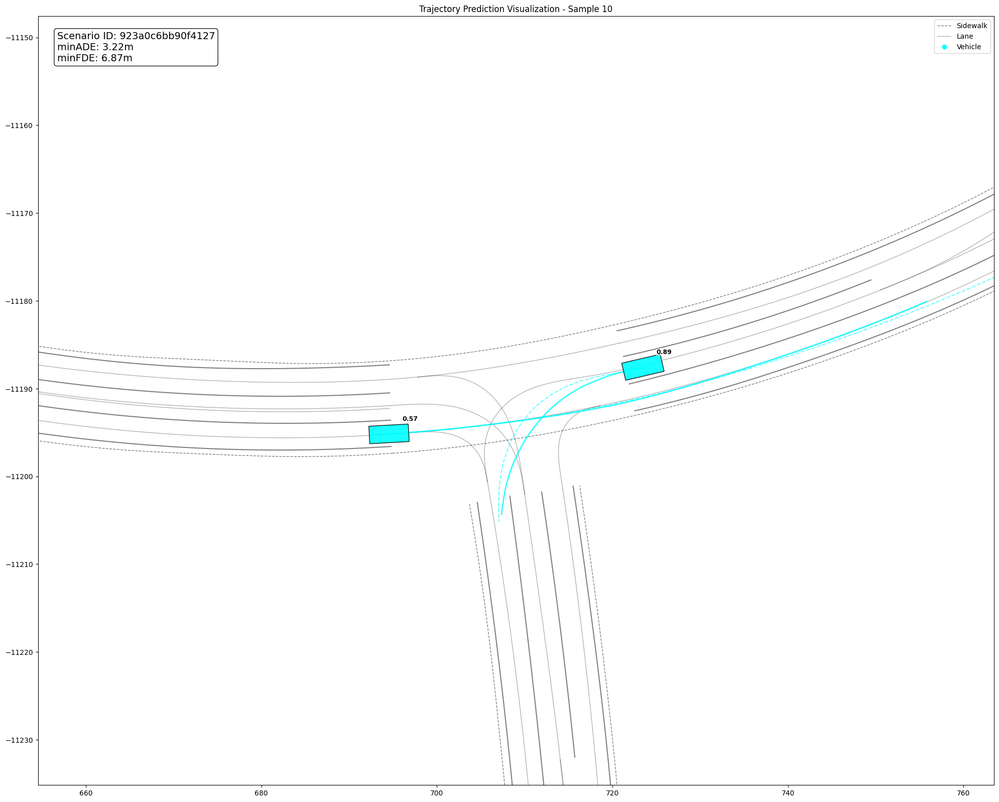

Scenario:10, Scenario ID:923a0c6bb90f4127, Number of Agents:2
--- Scene Stats (ID: 11) ---
Valid Agents: 6
Scene minADE: 2.3044
Scene minFDE: 6.2431


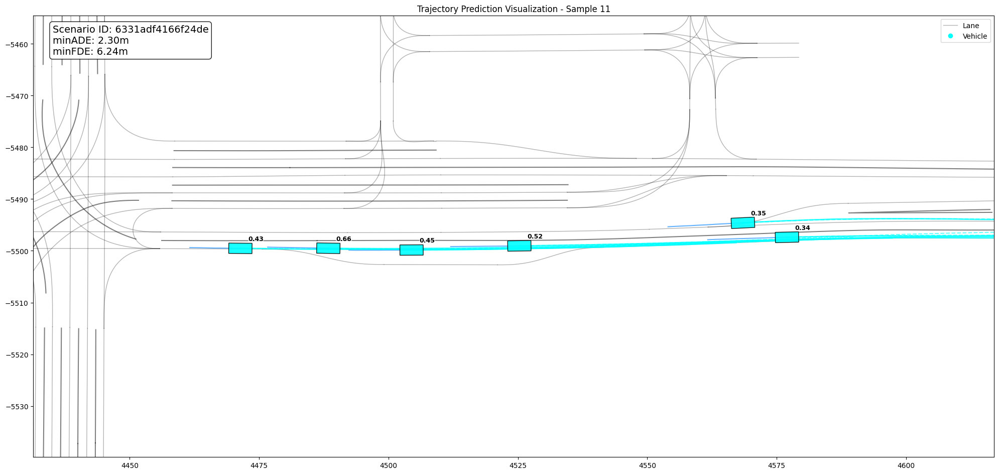

Scenario:11, Scenario ID:6331adf4166f24de, Number of Agents:6
--- Scene Stats (ID: 12) ---
Valid Agents: 8
Scene minADE: 2.4404
Scene minFDE: 6.6070


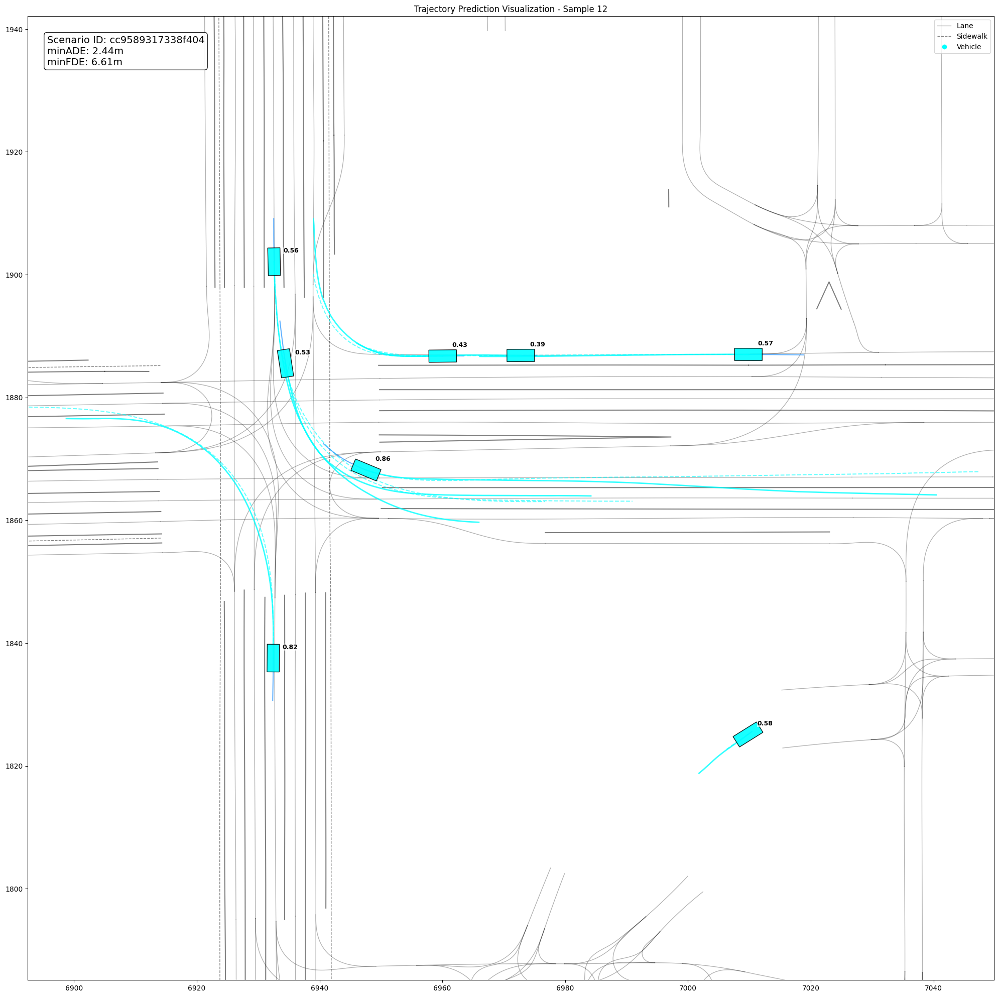

Scenario:12, Scenario ID:cc9589317338f404, Number of Agents:8
--- Scene Stats (ID: 13) ---
Valid Agents: 2
Scene minADE: 2.7102
Scene minFDE: 3.9183


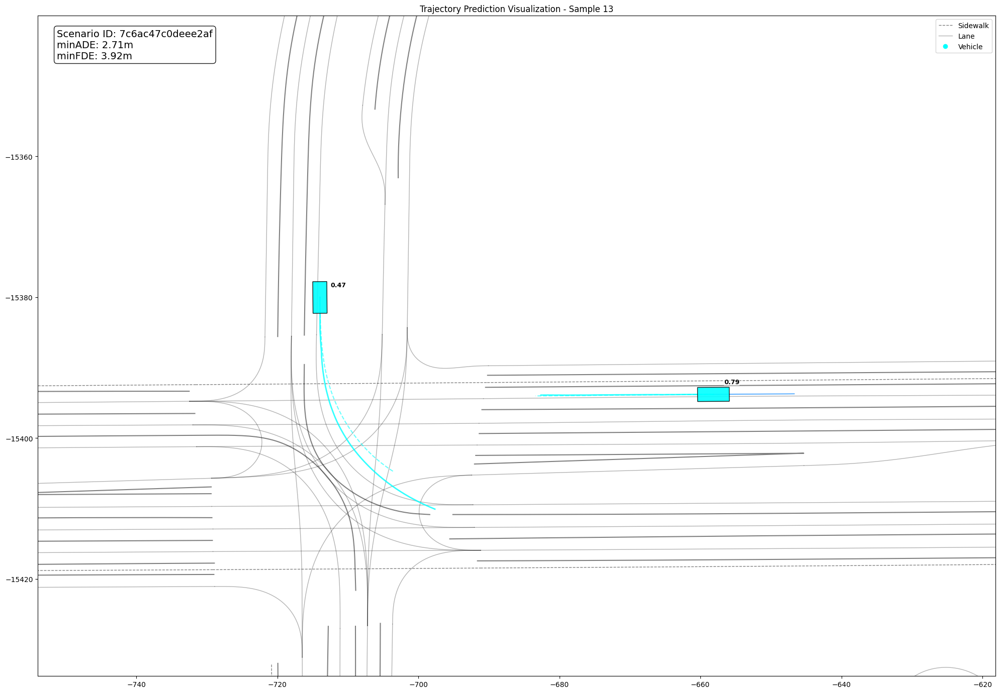

Scenario:13, Scenario ID:7c6ac47c0deee2af, Number of Agents:2
--- Scene Stats (ID: 14) ---
Valid Agents: 1
Scene minADE: 0.4226
Scene minFDE: 0.7320


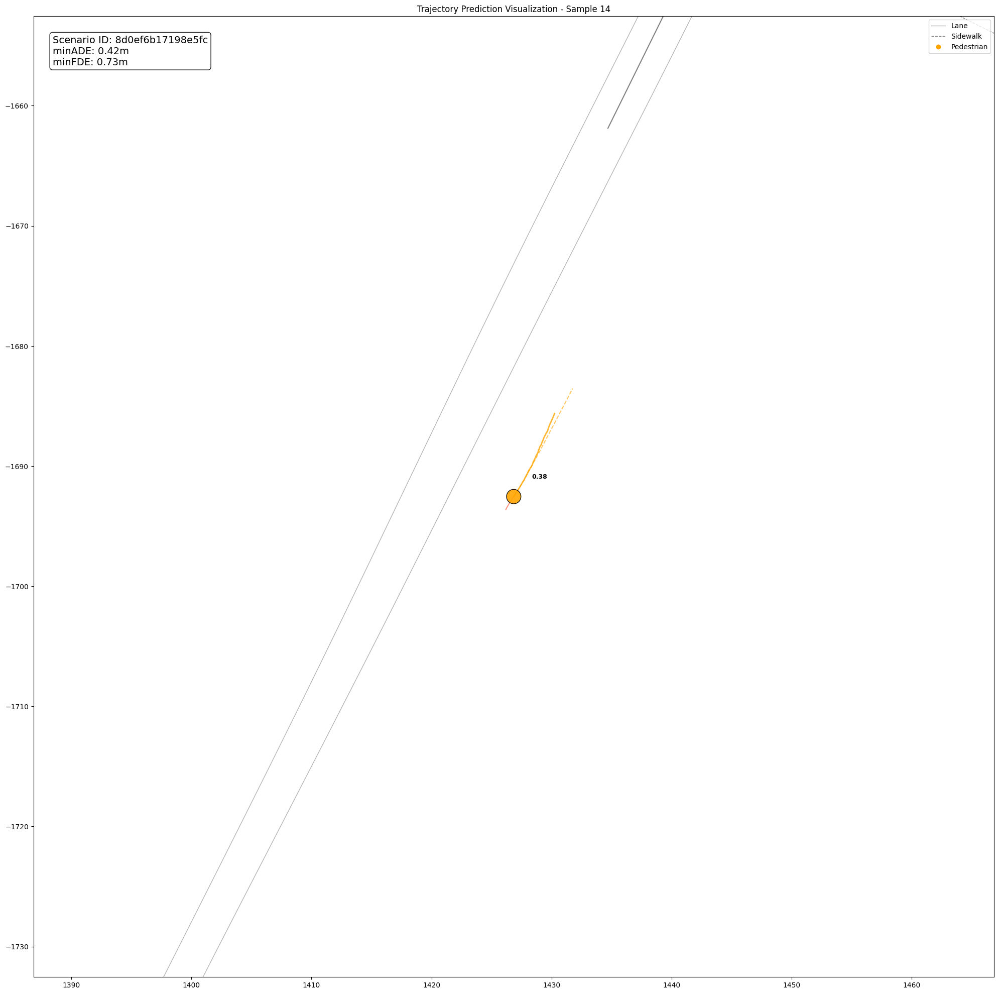

Scenario:14, Scenario ID:8d0ef6b17198e5fc, Number of Agents:1
--- Scene Stats (ID: 15) ---
Valid Agents: 2
Scene minADE: 2.8414
Scene minFDE: 7.1938


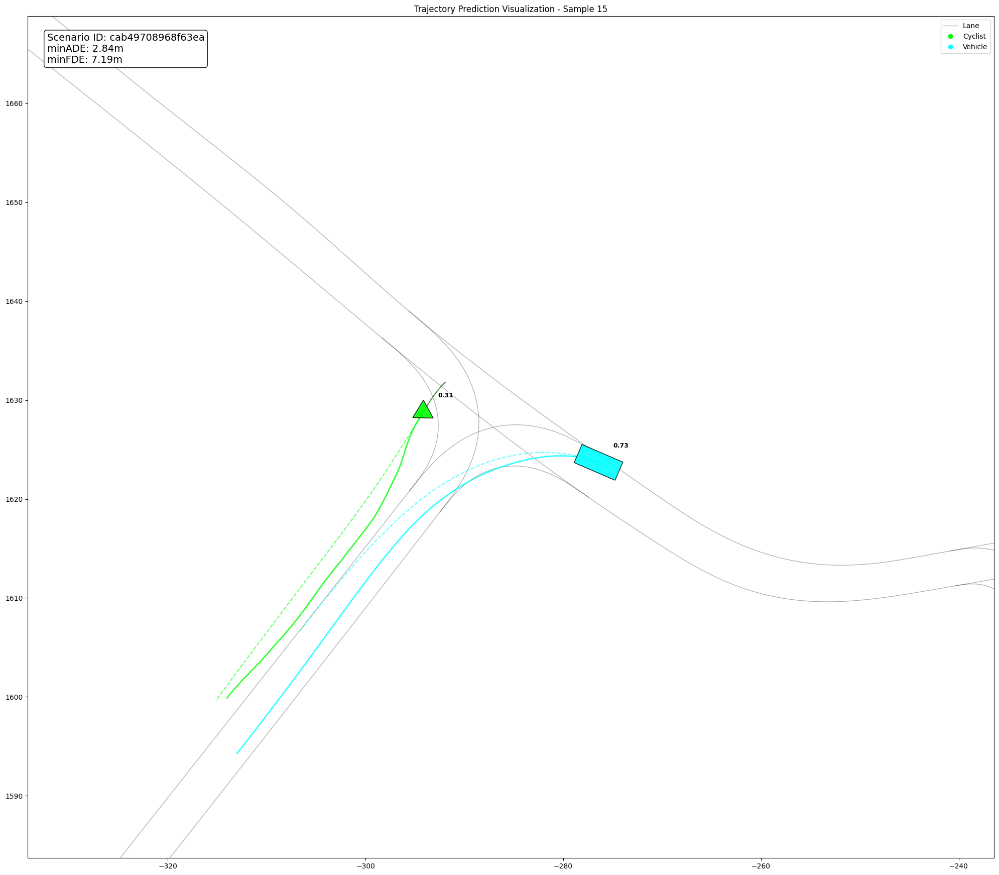

Scenario:15, Scenario ID:cab49708968f63ea, Number of Agents:2
--- Scene Stats (ID: 16) ---
Valid Agents: 4
Scene minADE: 1.9491
Scene minFDE: 4.3826


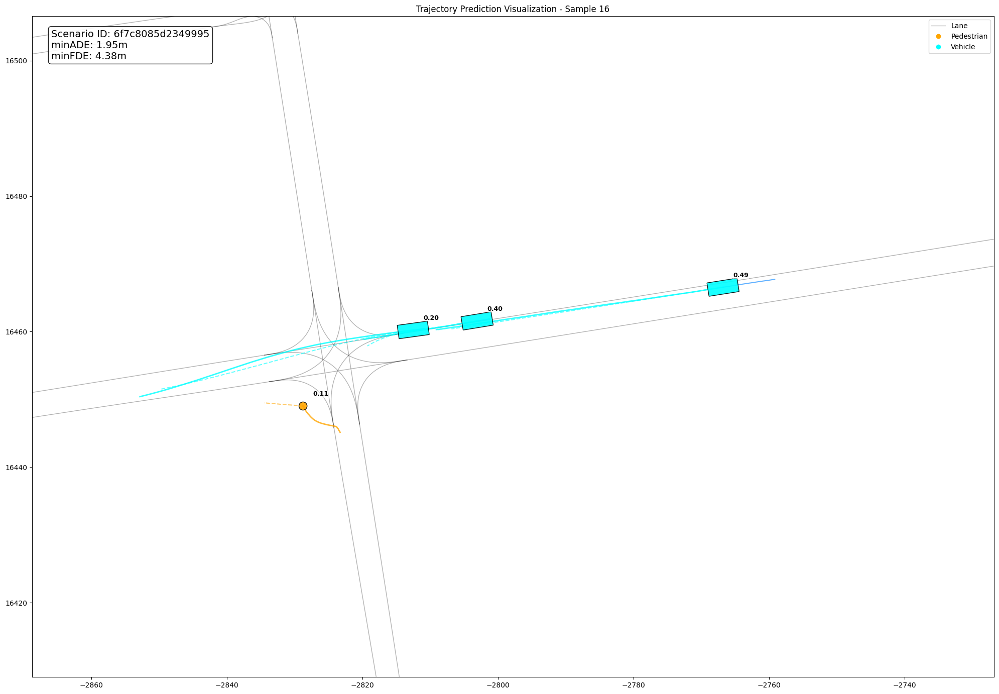

Scenario:16, Scenario ID:6f7c8085d2349995, Number of Agents:4
--- Scene Stats (ID: 17) ---
Valid Agents: 6
Scene minADE: 3.2332
Scene minFDE: 8.8049


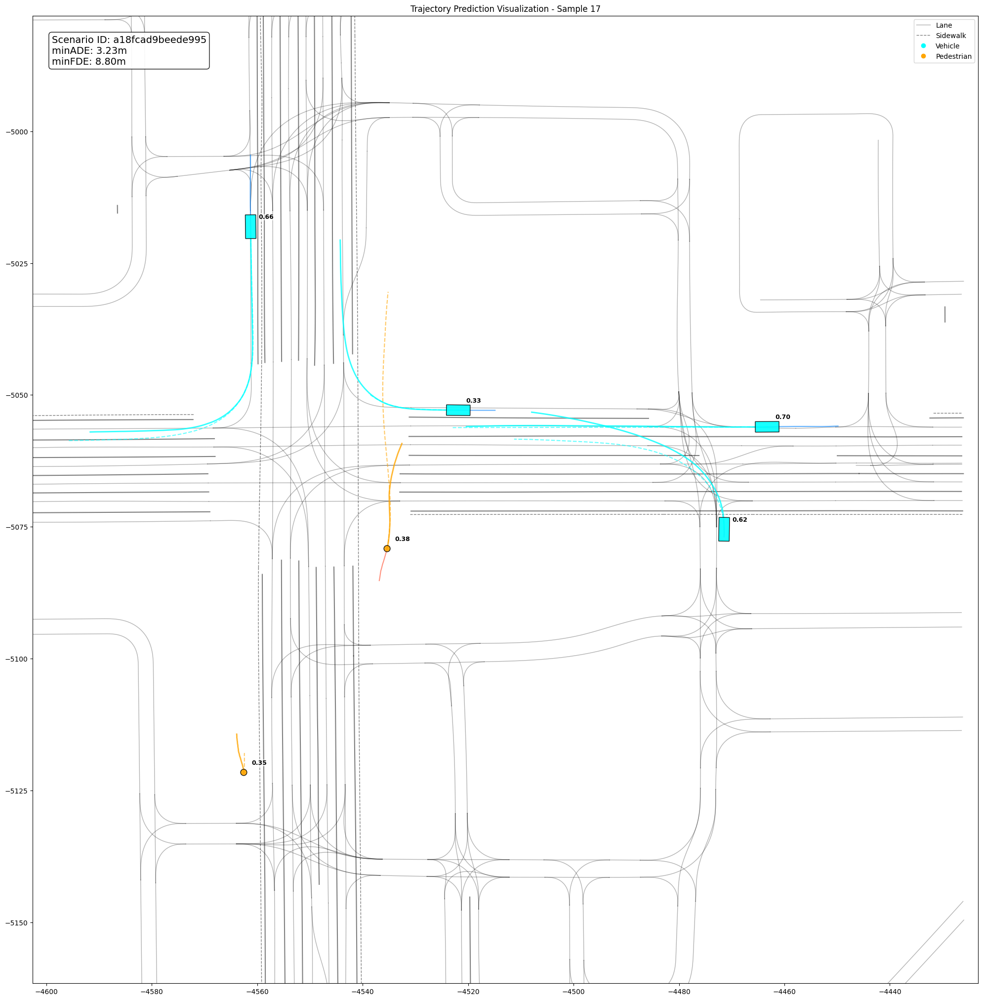

Scenario:17, Scenario ID:a18fcad9beede995, Number of Agents:6
--- Scene Stats (ID: 18) ---
Valid Agents: 7
Scene minADE: 3.6249
Scene minFDE: 11.9240


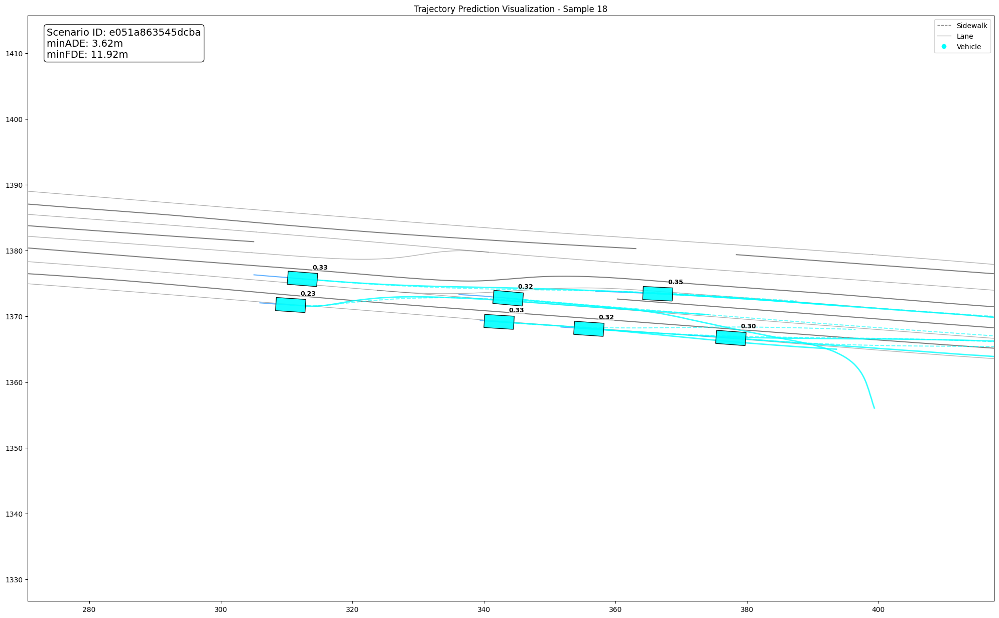

Scenario:18, Scenario ID:e051a863545dcba, Number of Agents:7
--- Scene Stats (ID: 19) ---
Valid Agents: 2
Scene minADE: 4.1412
Scene minFDE: 12.5341


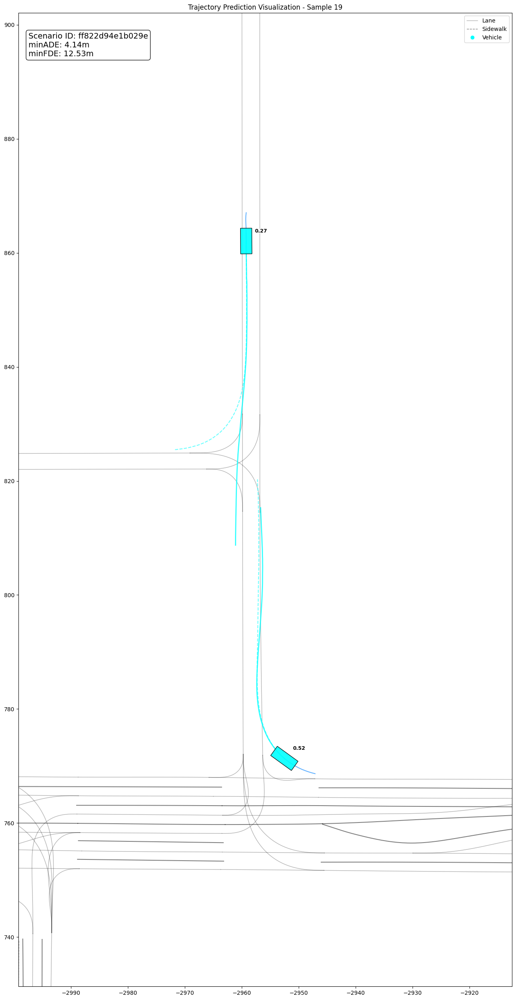

Scenario:19, Scenario ID:ff822d94e1b029e, Number of Agents:2
--- Scene Stats (ID: 20) ---
Valid Agents: 2
Scene minADE: 7.4837
Scene minFDE: 20.7854


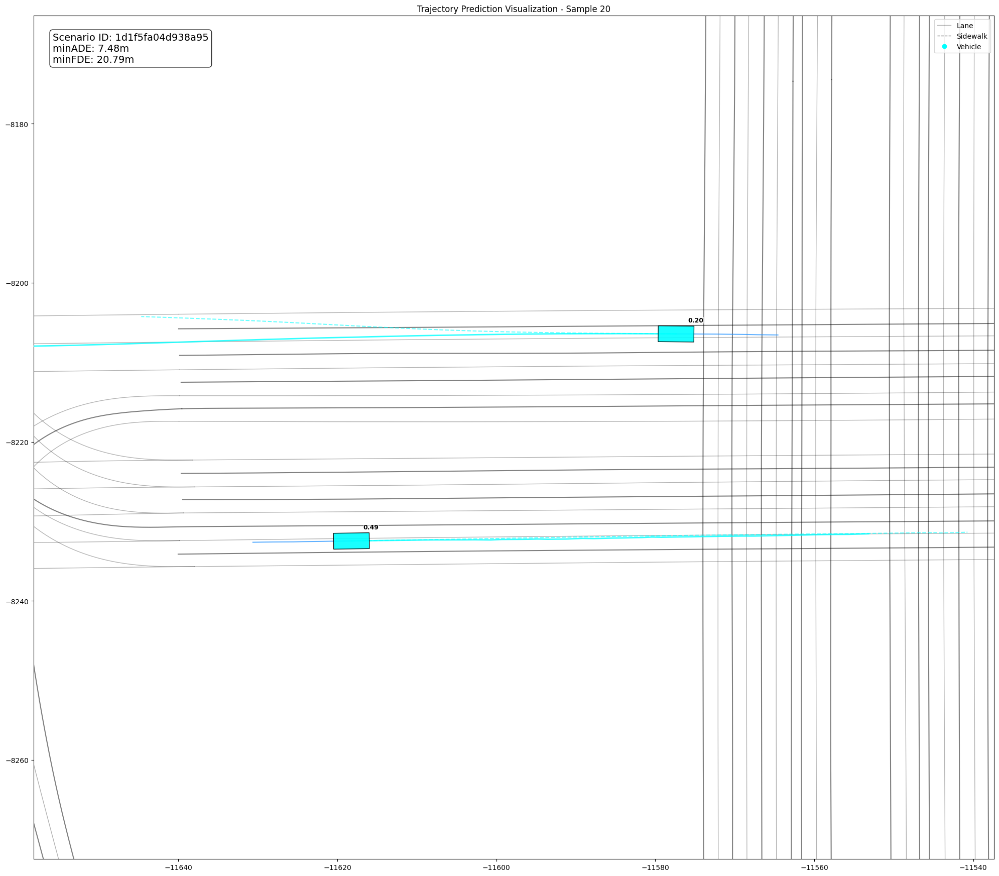

Scenario:20, Scenario ID:1d1f5fa04d938a95, Number of Agents:2
--- Scene Stats (ID: 21) ---
Valid Agents: 5
Scene minADE: 2.9809
Scene minFDE: 7.4200


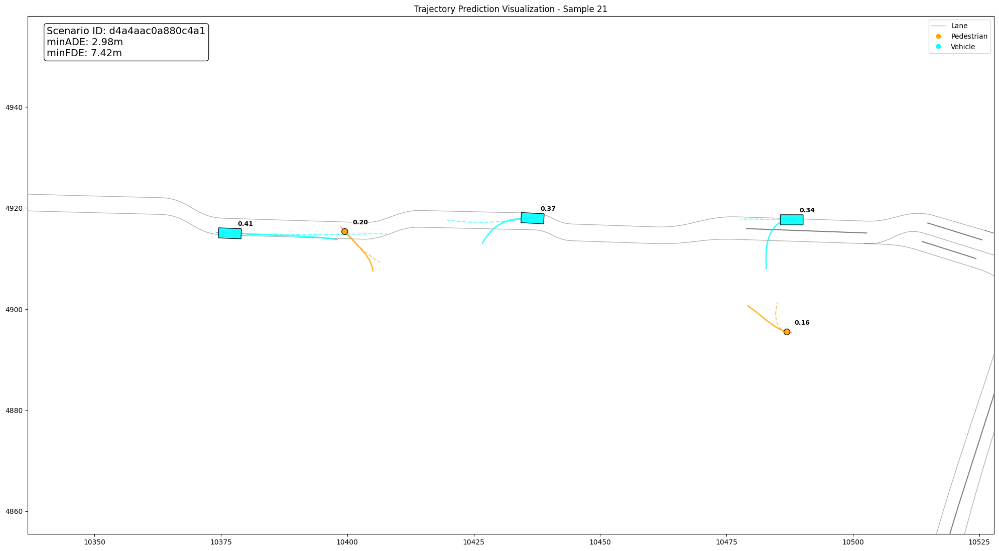

Scenario:21, Scenario ID:d4a4aac0a880c4a1, Number of Agents:5
--- Scene Stats (ID: 22) ---
Valid Agents: 5
Scene minADE: 1.8433
Scene minFDE: 6.1859


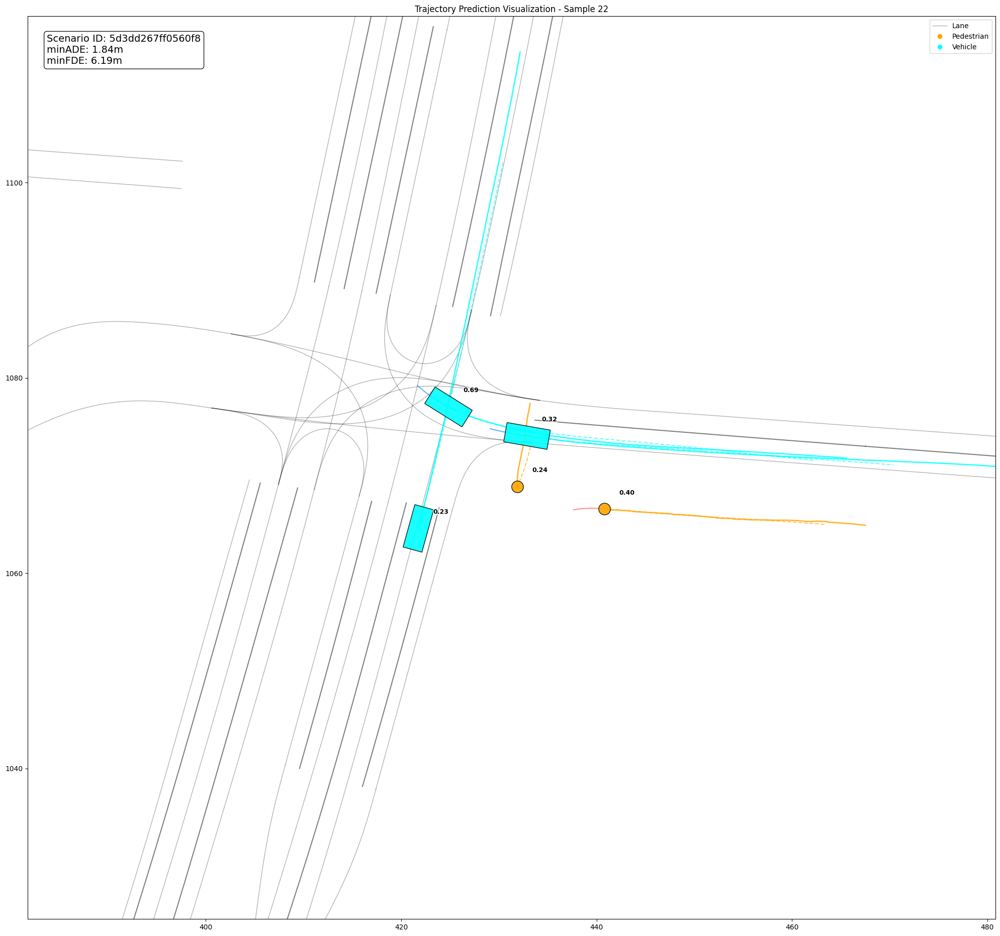

Scenario:22, Scenario ID:5d3dd267ff0560f8, Number of Agents:5
--- Scene Stats (ID: 23) ---
Valid Agents: 4
Scene minADE: 0.9159
Scene minFDE: 1.6552


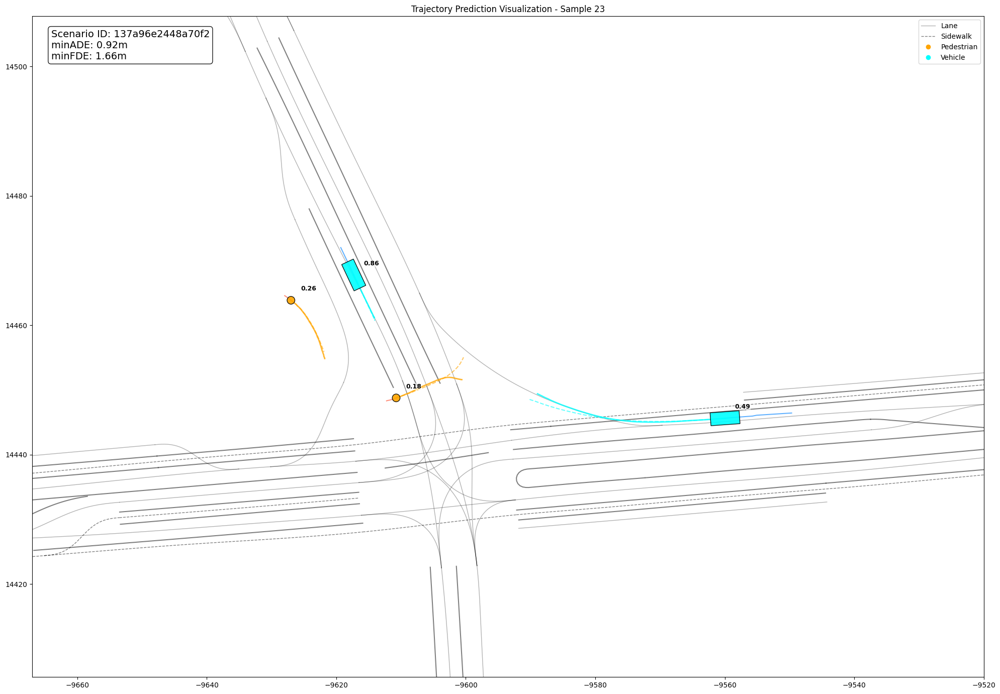

Scenario:23, Scenario ID:137a96e2448a70f2, Number of Agents:4
--- Scene Stats (ID: 24) ---
Valid Agents: 5
Scene minADE: 3.6673
Scene minFDE: 8.0579


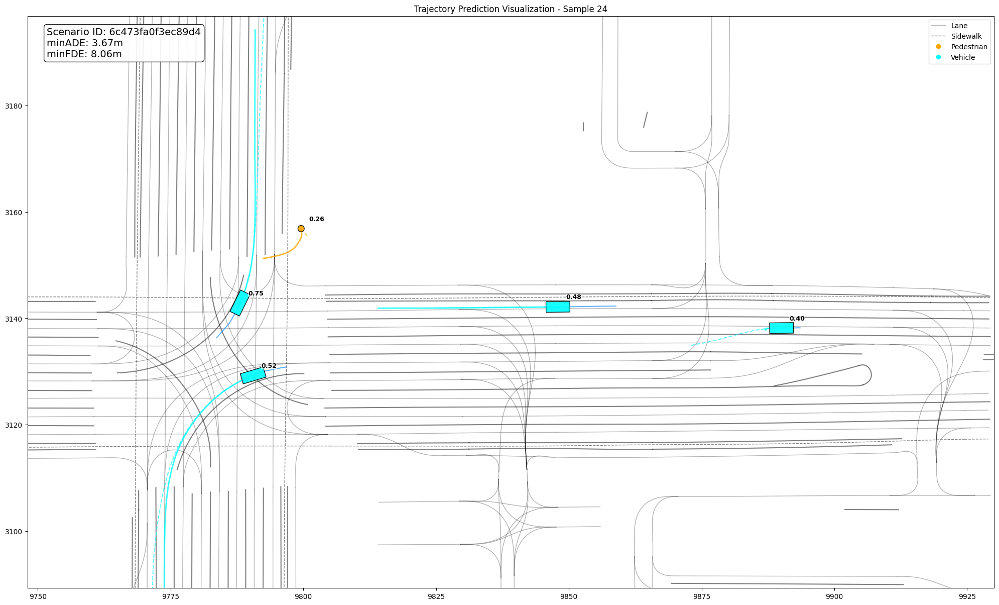

Scenario:24, Scenario ID:6c473fa0f3ec89d4, Number of Agents:5
--- Scene Stats (ID: 25) ---
Valid Agents: 5
Scene minADE: 3.4342
Scene minFDE: 10.1472


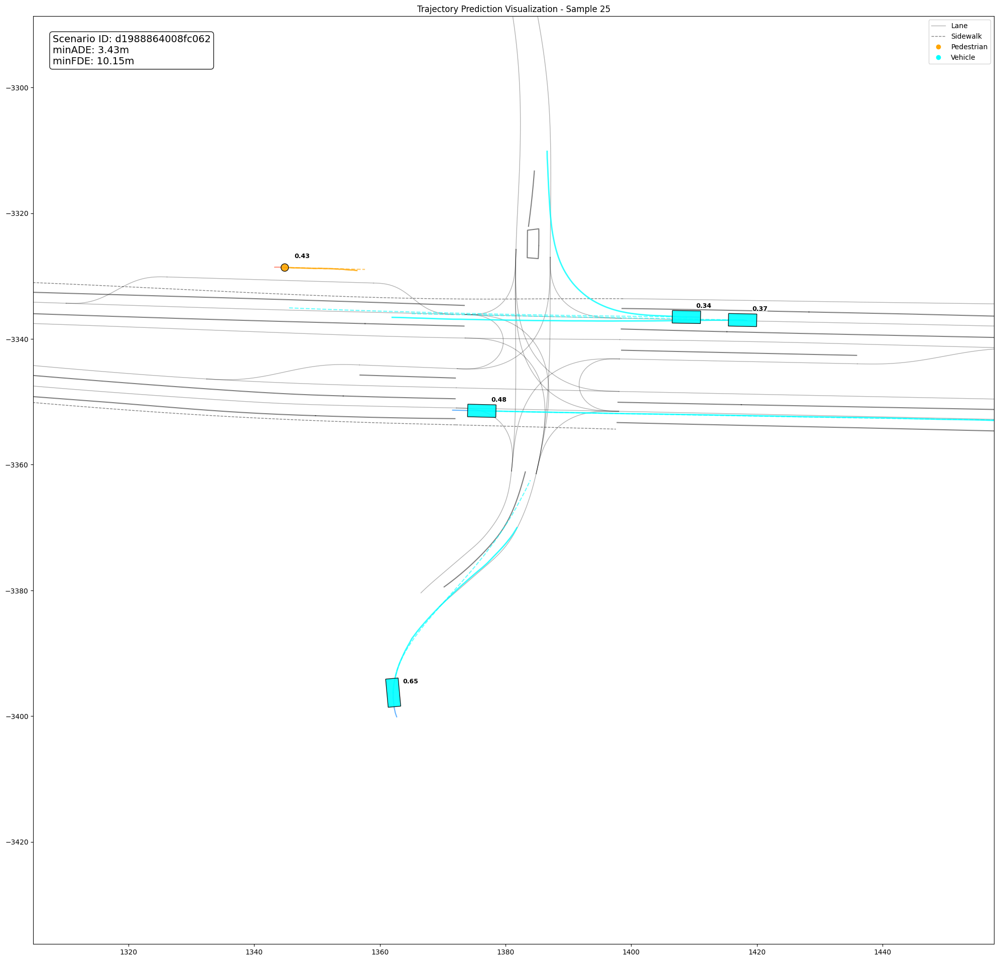

Scenario:25, Scenario ID:d1988864008fc062, Number of Agents:5
--- Scene Stats (ID: 26) ---
Valid Agents: 2
Scene minADE: 2.6973
Scene minFDE: 6.8390


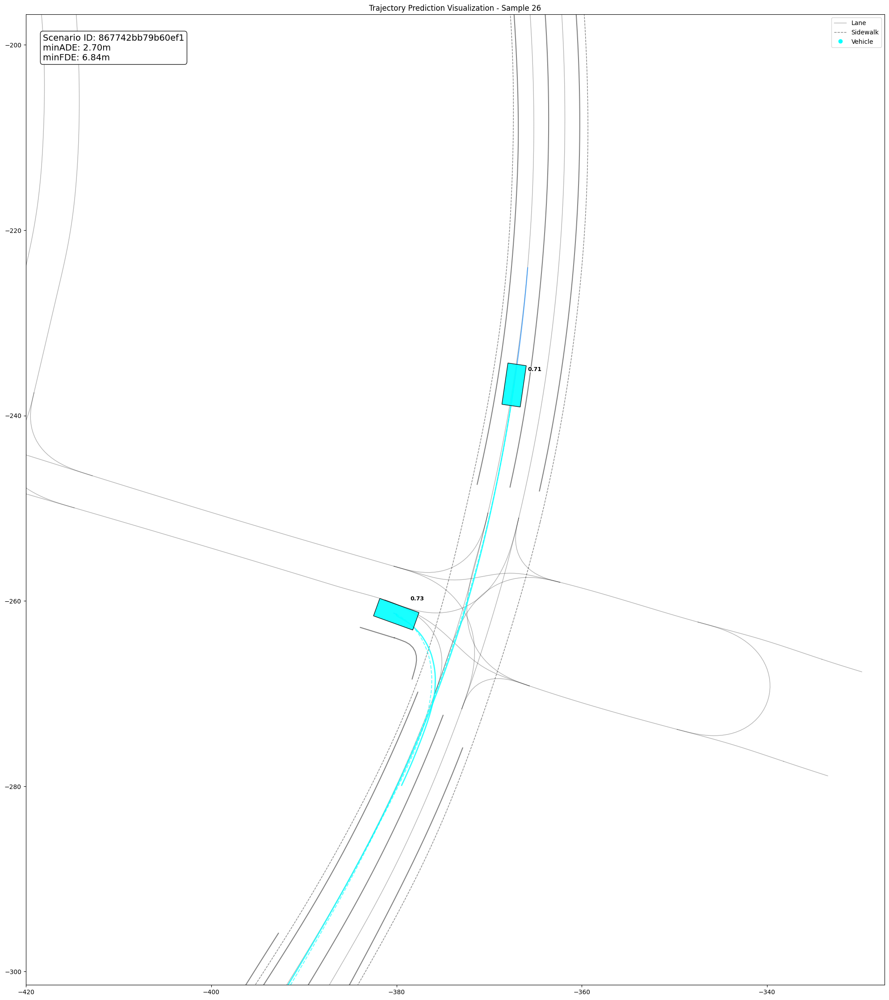

Scenario:26, Scenario ID:867742bb79b60ef1, Number of Agents:2
--- Scene Stats (ID: 27) ---
Valid Agents: 5
Scene minADE: 2.5700
Scene minFDE: 7.0484


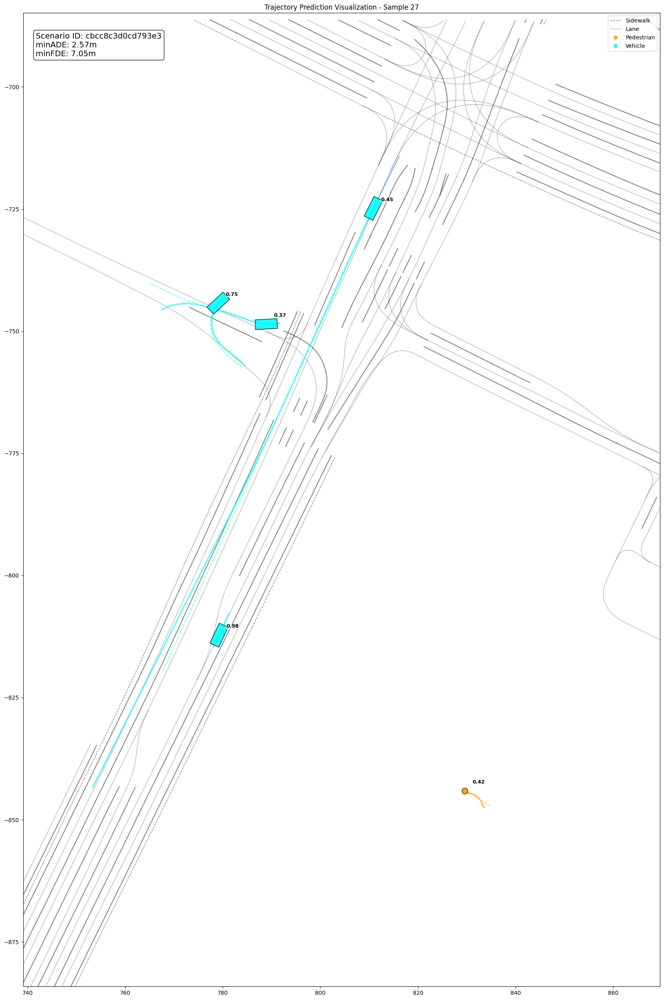

Scenario:27, Scenario ID:cbcc8c3d0cd793e3, Number of Agents:5
--- Scene Stats (ID: 28) ---
Valid Agents: 4
Scene minADE: 2.5158
Scene minFDE: 6.7531


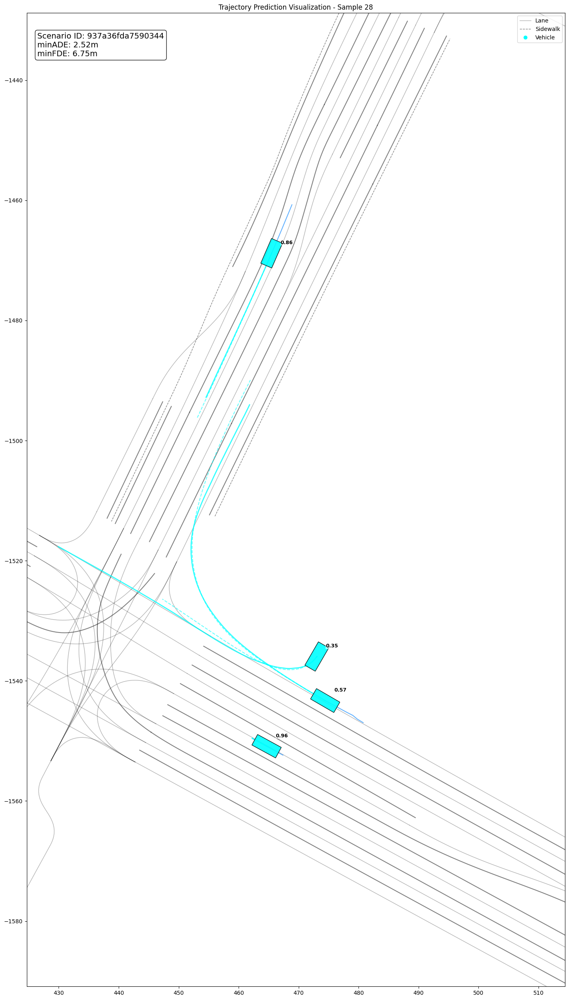

Scenario:28, Scenario ID:937a36fda7590344, Number of Agents:4
--- Scene Stats (ID: 29) ---
Valid Agents: 7
Scene minADE: 3.4053
Scene minFDE: 9.1845


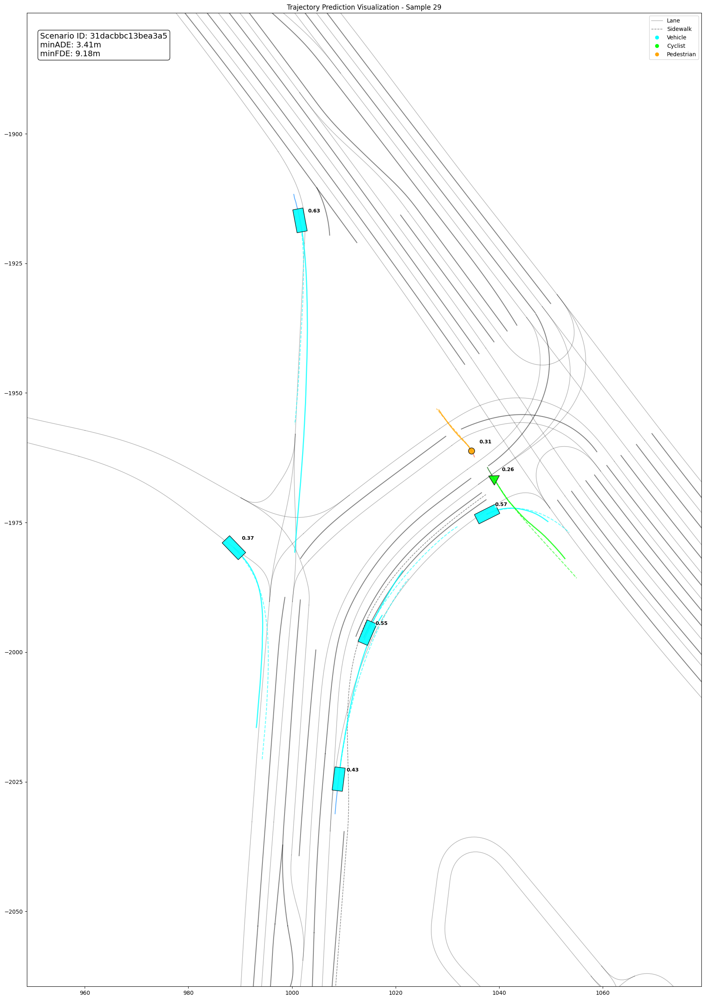

Scenario:29, Scenario ID:31dacbbc13bea3a5, Number of Agents:7
--- Scene Stats (ID: 30) ---
Valid Agents: 4
Scene minADE: 2.5615
Scene minFDE: 7.9027


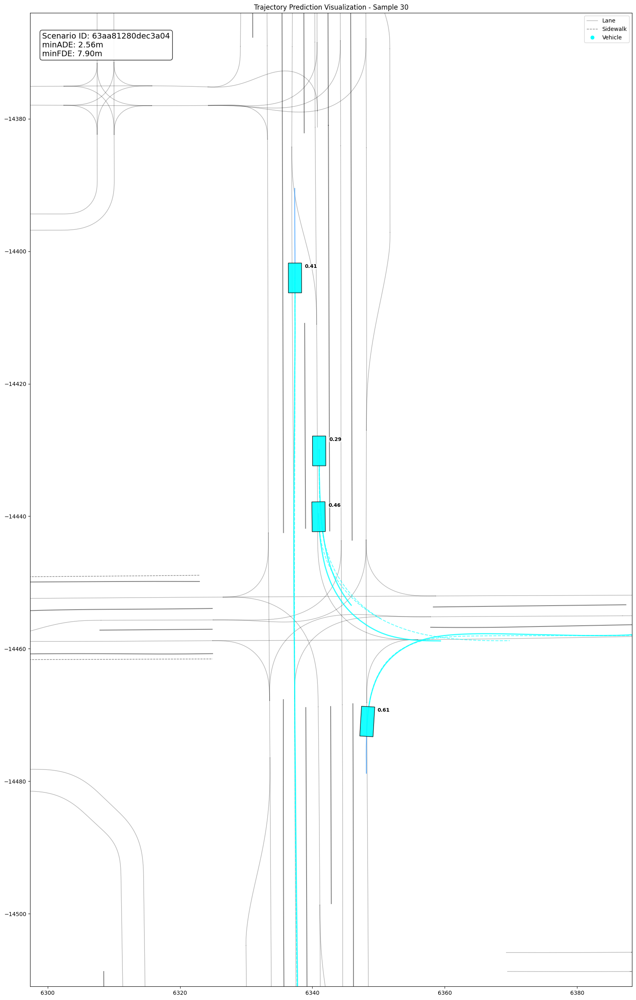

Scenario:30, Scenario ID:63aa81280dec3a04, Number of Agents:4
--- Scene Stats (ID: 31) ---
Valid Agents: 4
Scene minADE: 3.2926
Scene minFDE: 9.2050


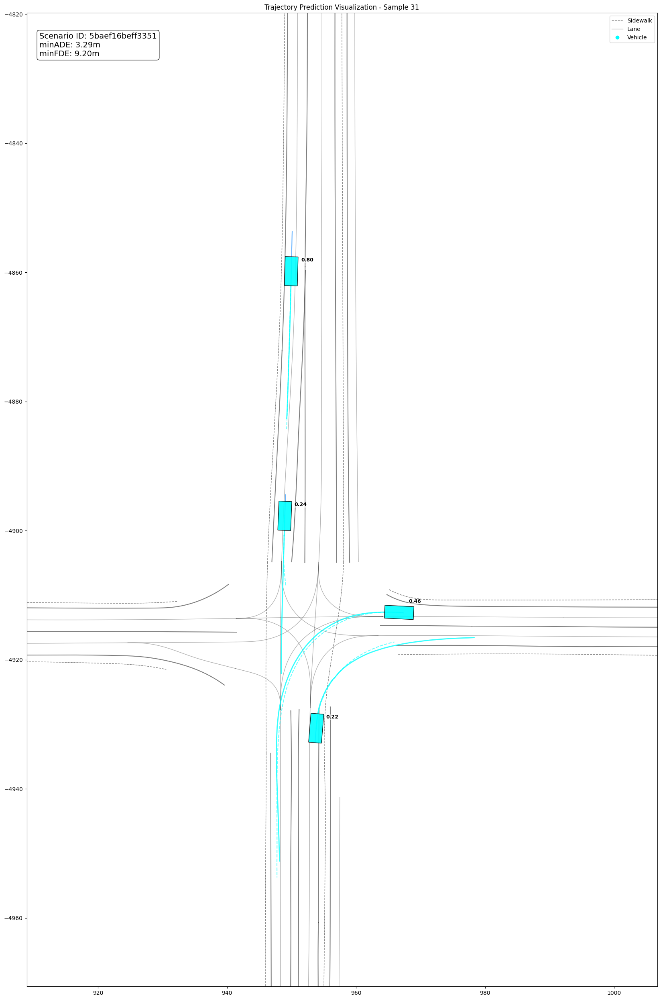

Scenario:31, Scenario ID:5baef16beff3351, Number of Agents:4
--- Scene Stats (ID: 32) ---
Valid Agents: 4
Scene minADE: 3.6323
Scene minFDE: 13.1881


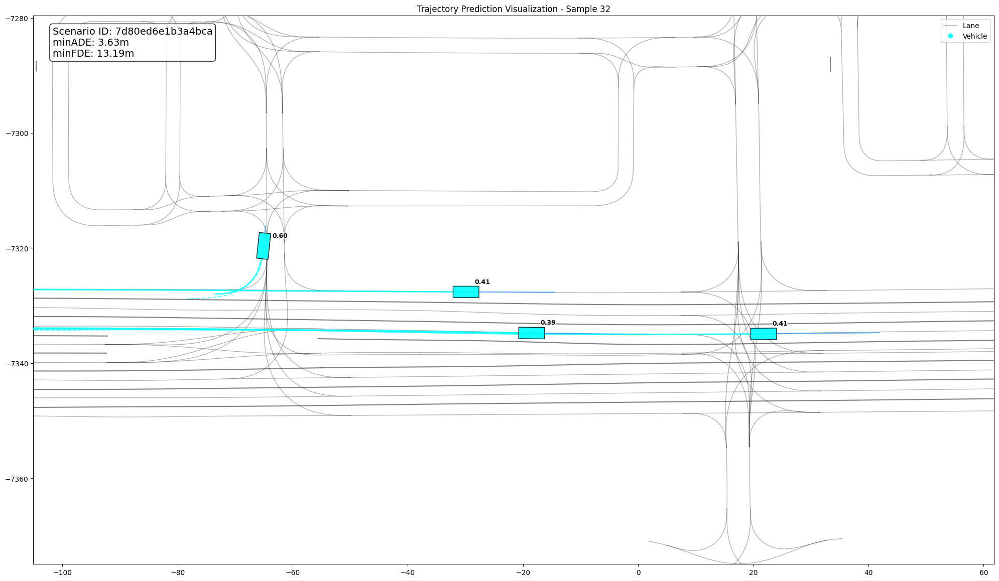

Scenario:32, Scenario ID:7d80ed6e1b3a4bca, Number of Agents:4
--- Scene Stats (ID: 33) ---
Valid Agents: 2
Scene minADE: 1.5004
Scene minFDE: 4.0835


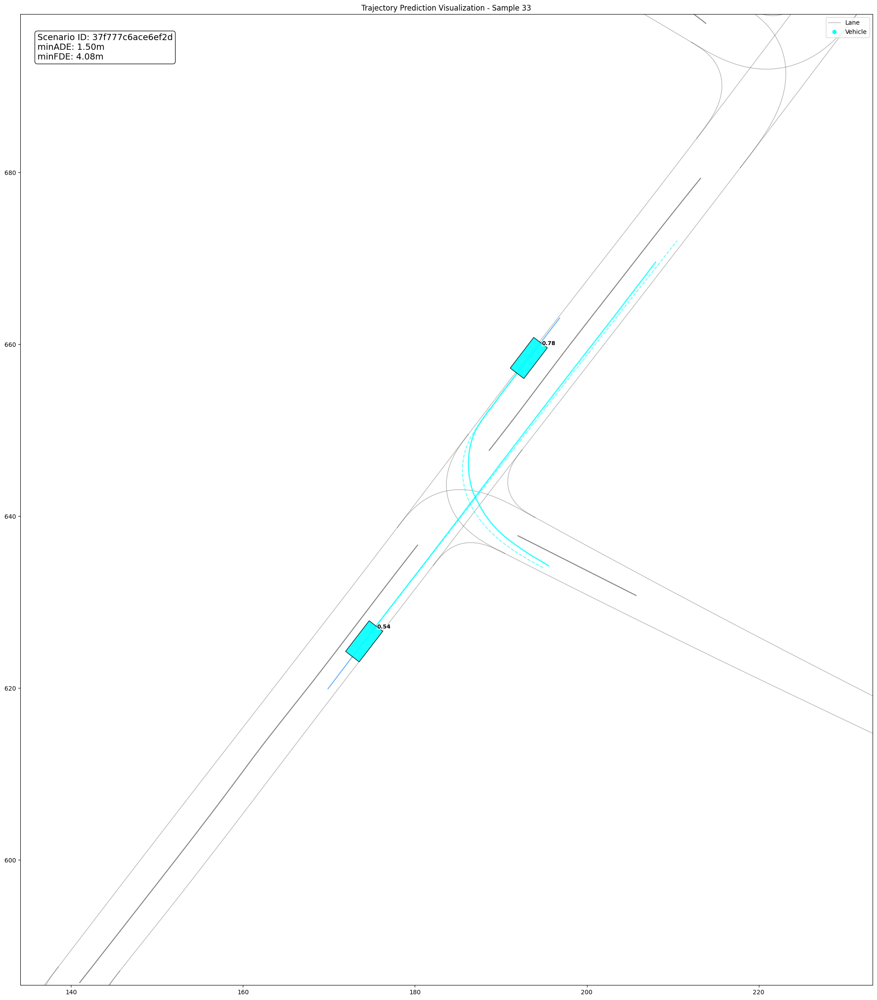

Scenario:33, Scenario ID:37f777c6ace6ef2d, Number of Agents:2
--- Scene Stats (ID: 34) ---
Valid Agents: 2
Scene minADE: 0.9409
Scene minFDE: 1.8770


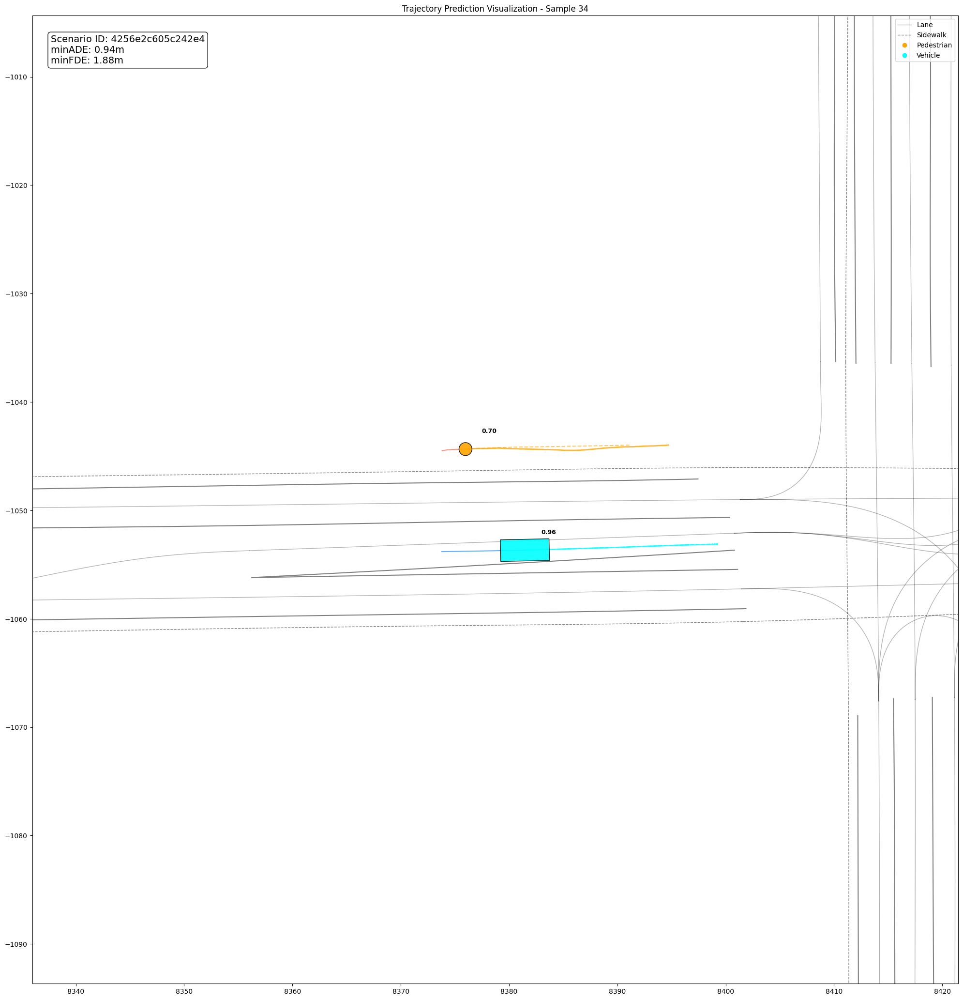

Scenario:34, Scenario ID:4256e2c605c242e4, Number of Agents:2
--- Scene Stats (ID: 35) ---
Valid Agents: 4
Scene minADE: 4.8437
Scene minFDE: 15.3714


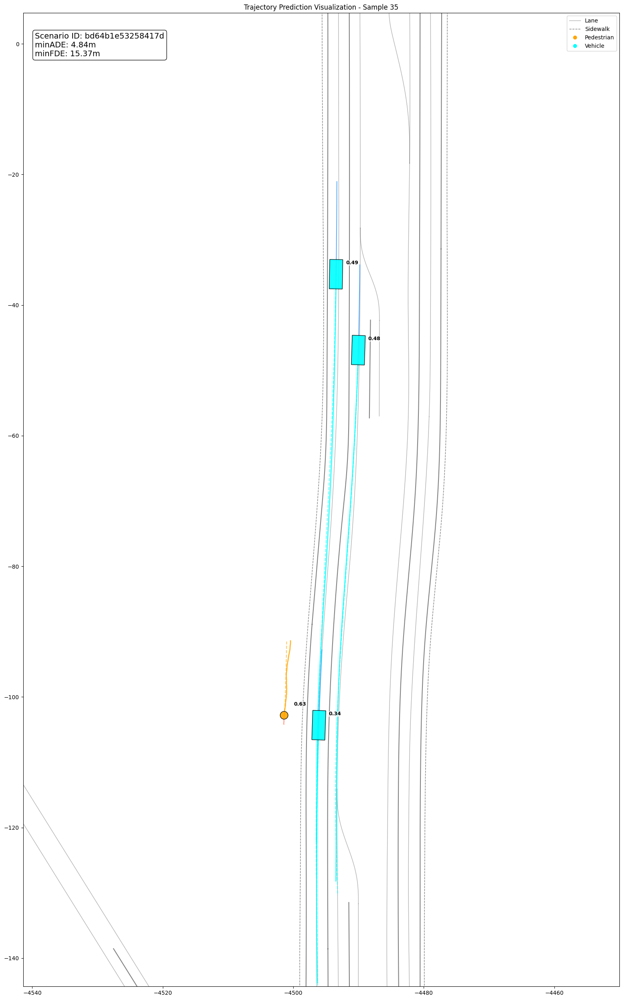

Scenario:35, Scenario ID:bd64b1e53258417d, Number of Agents:4
--- Scene Stats (ID: 36) ---
Valid Agents: 3
Scene minADE: 0.6058
Scene minFDE: 1.6153


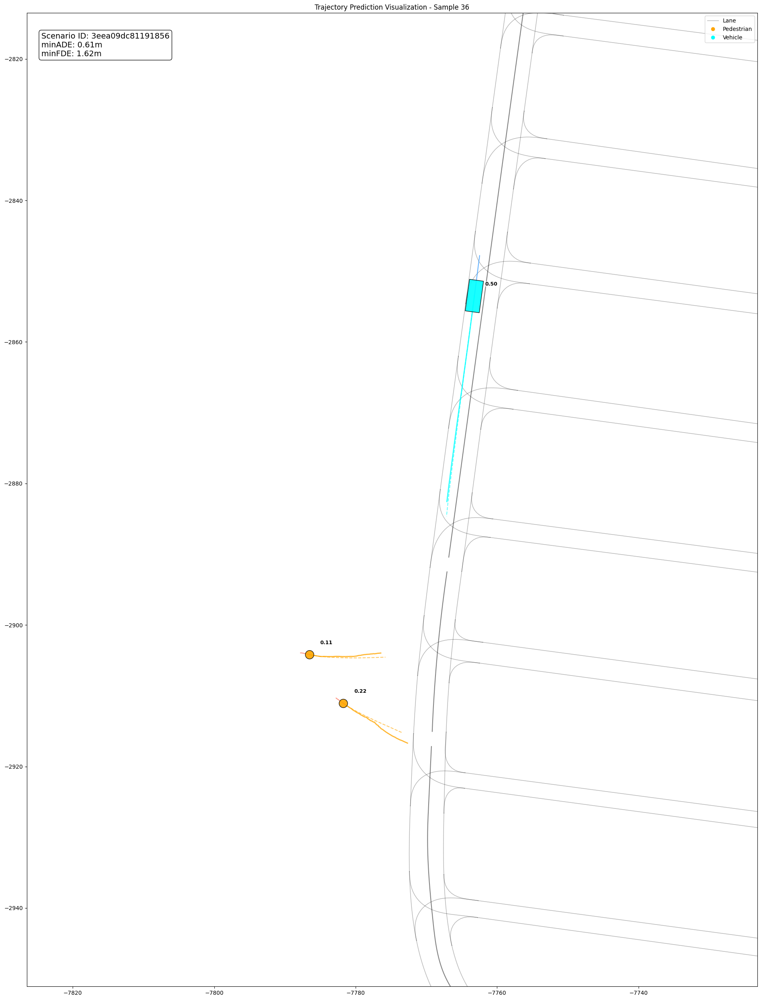

Scenario:36, Scenario ID:3eea09dc81191856, Number of Agents:3
--- Scene Stats (ID: 37) ---
Valid Agents: 7
Scene minADE: 2.8351
Scene minFDE: 8.3560


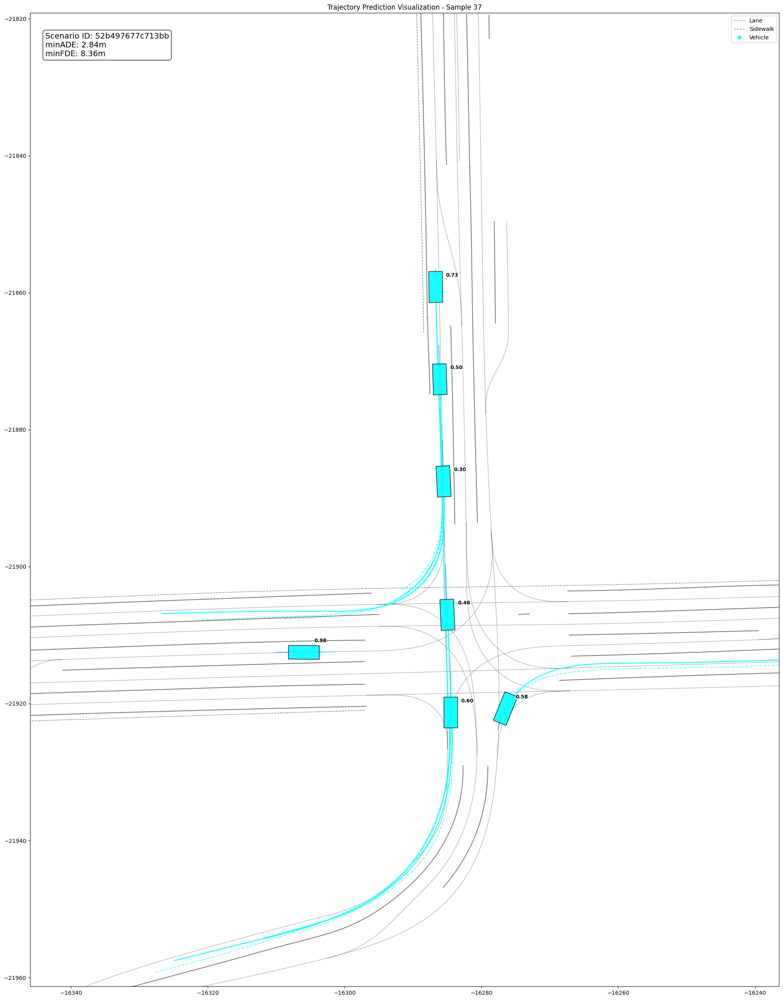

Scenario:37, Scenario ID:52b497677c713bb, Number of Agents:7
--- Scene Stats (ID: 38) ---
Valid Agents: 2
Scene minADE: 0.9653
Scene minFDE: 0.6981


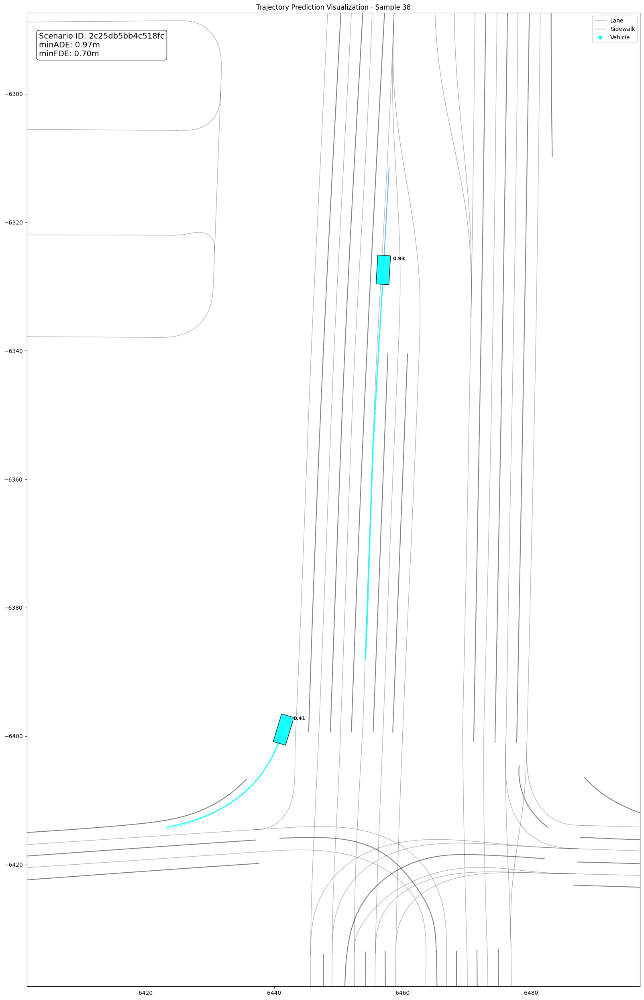

Scenario:38, Scenario ID:2c25db5bb4c518fc, Number of Agents:2
--- Scene Stats (ID: 39) ---
Valid Agents: 2
Scene minADE: 2.8836
Scene minFDE: 8.8602


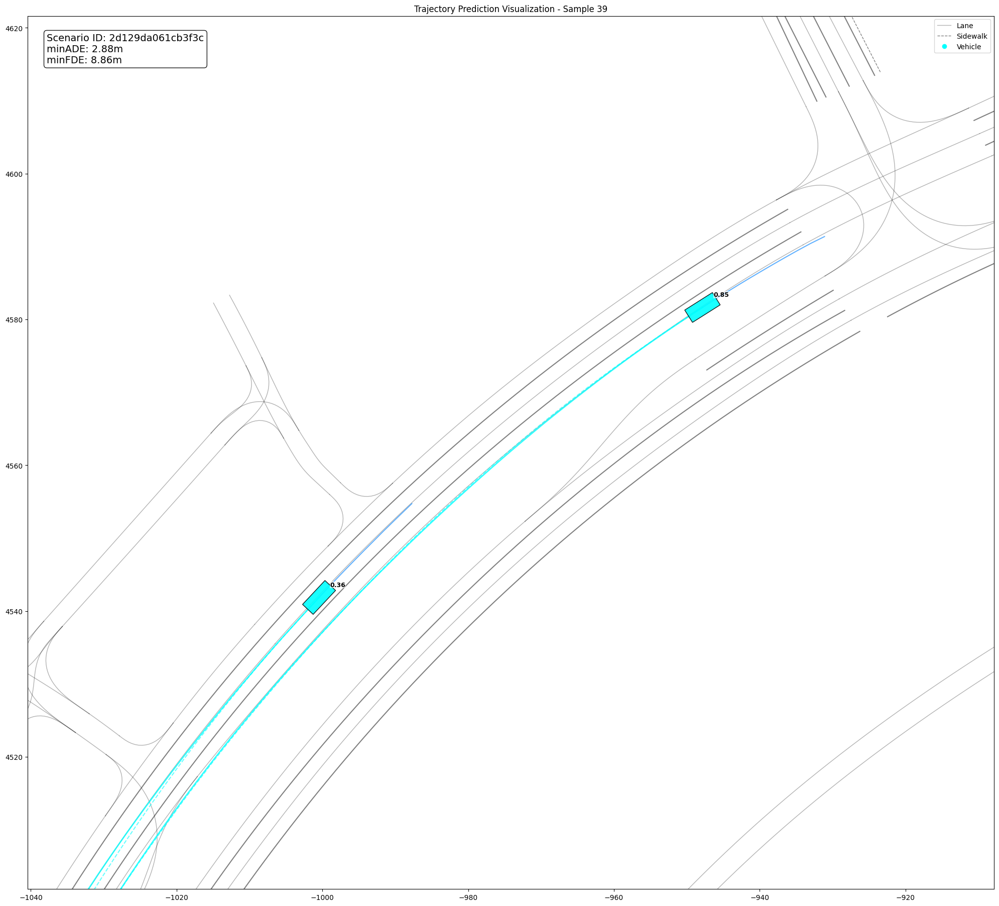

Scenario:39, Scenario ID:2d129da061cb3f3c, Number of Agents:2


In [37]:
# plot all agents (TYPE_VEHICLE, TYPE_PEDESTRIAN, TYPE_CYCLIST) on the same map for a given scenario instead of just one type of agent at a time
# plot VEHICLE traj output
cfg_file_path = '/data/robert/CP-X-Prediction/Intersection-Code/Intersection-MTR/Prediction/MTR/tools/cfgs/challenge/mtr-testing-CPX-Prediction.yaml'
testing_set = get_testing_set(cfg_file=cfg_file_path)

k = 0
mode = 1 # only plot the top 3 trajectories
for i in range(len(test_results)):
    scenario_id = str(test_results[i][0]['scenario_id'])
    raw_map_data = testing_set.get_map_data_by_id(scenario_id)
    vector_map = create_map_object(raw_map_data)
    if vector_map is not None:
        plot_traj_withmap_withheading_specific(i,test_results, vector_map, mode)
        print(f'Scenario:{i}, Scenario ID:{scenario_id}, Number of Agents:{len(test_results[i])}')
    k+=1
    if k >= 40:
        break

In [35]:

# # plot PEDESTRIAN traj output
# k = 0
# for i in range(len(test_results)):
#     for j in range(len(test_results[i])):
#         if test_results[i][j]['object_type'] == 'TYPE_PEDESTRIAN':
#             scenario_id = str(test_results[i][j]['scenario_id'])
#             vector_map = vector_map_dict[scenario_id]
#             if vector-_map is not None:
#                 plot_traj_withmap_withheading(i,j, test_results,vector_map,6)
#                 print('----------------------------------------------------')
#                 k += 1
#     if k >= 10:
#         break

In [36]:

# # plot CYCLIST traj output
# k = 0
# for i in range(len(test_results)):
#     for j in range(len(test_results[i])):
#         if test_results[i][j]['object_type'] == 'TYPE_CYCLIST':
#             scenario_id = str(test_results[i][j]['scenario_id'])
#             vector_map = vector_map_dict[scenario_id]
#             if vector_map is not None:
#                 plot_traj_withmap_withheading(i,j, test_results,vector_map,6)
#                 print('----------------------------------------------------')
#                 k += 1
#     if k >= 10:
#         break